In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
# Read data
motion_09 = np.genfromtxt('../dataset2/motion_09.csv', delimiter=',')
print("Motion 0.9 data has a length of ", len(motion_09))

Motion 0.9 data has a length of  183023


## Visualizations

In [6]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FR)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FR)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FL)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FL)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RR)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RR)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RL)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RL)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FR)')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FR)', color='g')
          
    # FL plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FL)')
    ax3.set_xlabel('Time')
         
    # FL plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FL)', color='g')      
          
    # RR plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RR)')
    ax5.set_xlabel('Time')
         
    # RR plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RR)', color='g')   
          
    # RL plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RL)')
    ax7.set_xlabel('Time')
         
    # RL plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RL)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    ax.axvline(x=footstep_timestamp+100, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [7]:
"""
def get_specific_cmd(dataset, fwd, side, rot):
    return np.where(np.logical_and(dataset[:, 2] == fwd, 
                                   dataset[:, 3] == side, 
                                   dataset[:, 4] == rot))[0]
"""

def get_specific_cmd(dataset, fwd, side, rot):
    idxs = []
    for row_id, item in enumerate(dataset):
        if np.isclose(item[2], fwd, 0.01) and np.isclose(item[3], side, 0.01) and np.isclose(item[4], rot, 0.01):
            idxs.append(row_id)
    
    return idxs

In [8]:
def get_swinging_motions(dataset, height=-0.3):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 34] < height)[0]
    fl_min_height = np.where(dataset[:, 37] < height)[0]
    rr_min_height = np.where(dataset[:, 40] < height)[0]
    rl_min_height = np.where(dataset[:, 43] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## Motion_09

In [9]:
velocity = 0.904171

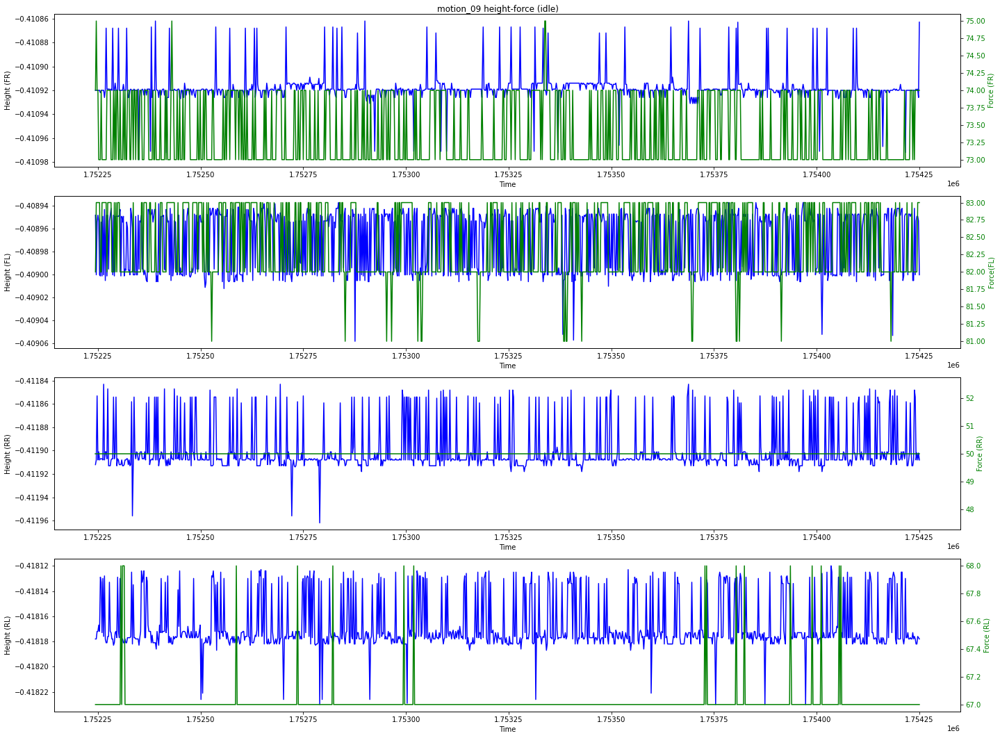

In [10]:
# Idle
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09)

sample_walking_fr_height = fr_min_height[:1000]
sample_walking_fl_height = fl_min_height[:1000]
sample_walking_rr_height = rr_min_height[:1000]
sample_walking_rl_height = rl_min_height[:1000]

plot_overlapping_data("motion_09 height-force (idle)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

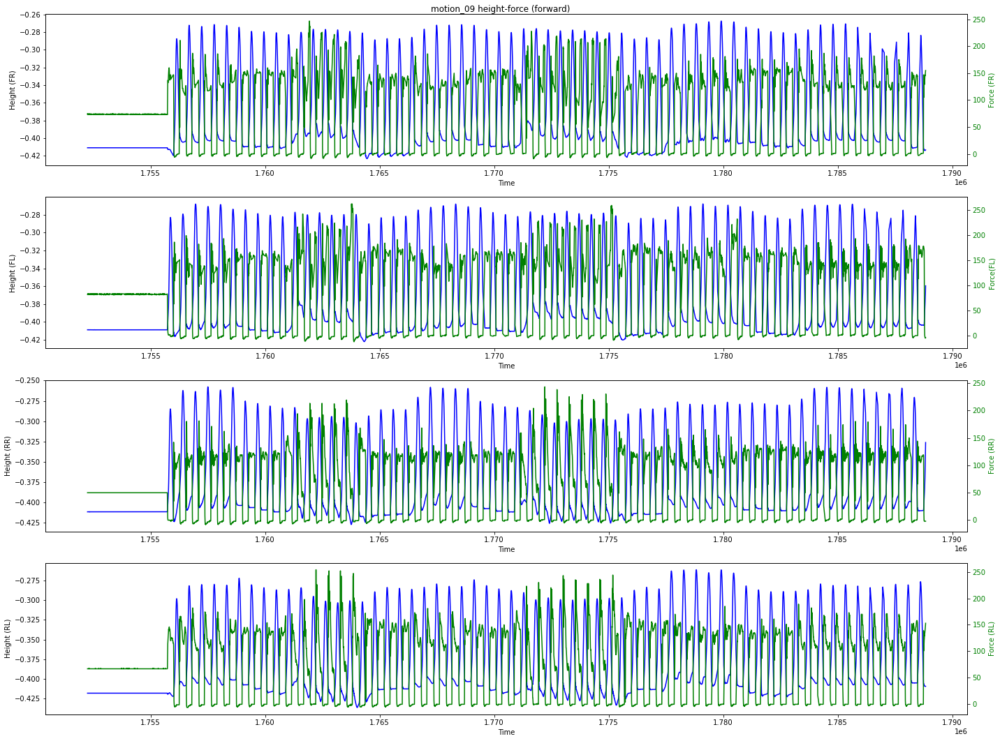

In [11]:
# Forward
fwd_cmds = get_specific_cmd(motion_09, velocity, 0, 0)
motion_09_fwd = motion_09[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (forward)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

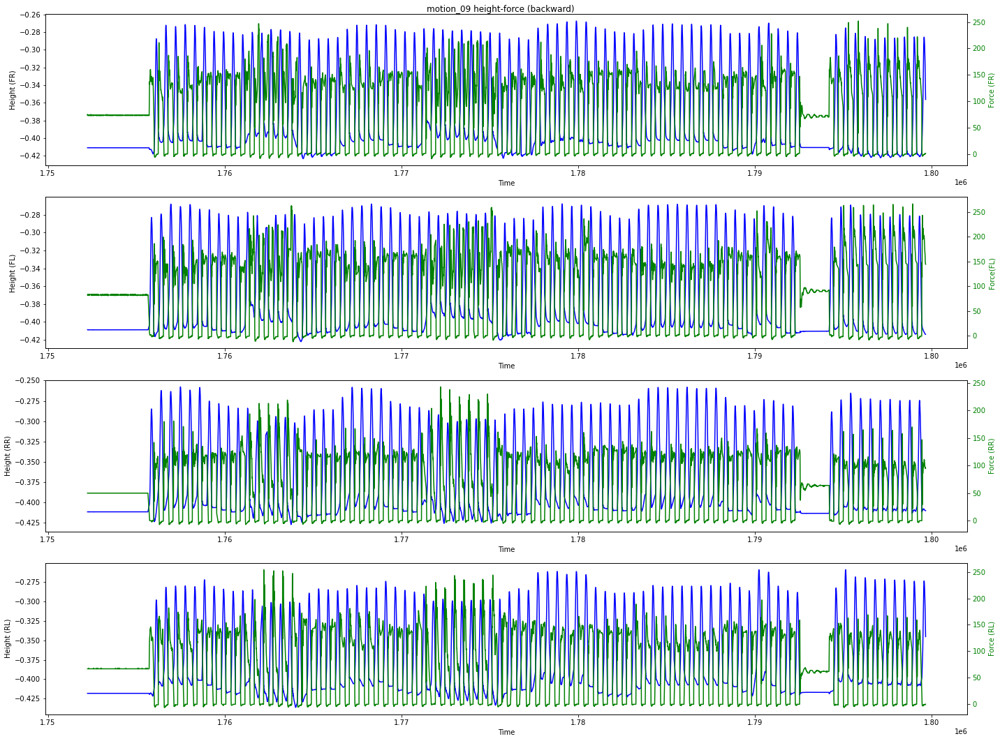

In [12]:
# Backwards
bwd_cmds = get_specific_cmd(motion_09, -velocity, 0, 0)
motion_09_bwd = motion_09[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (backward)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

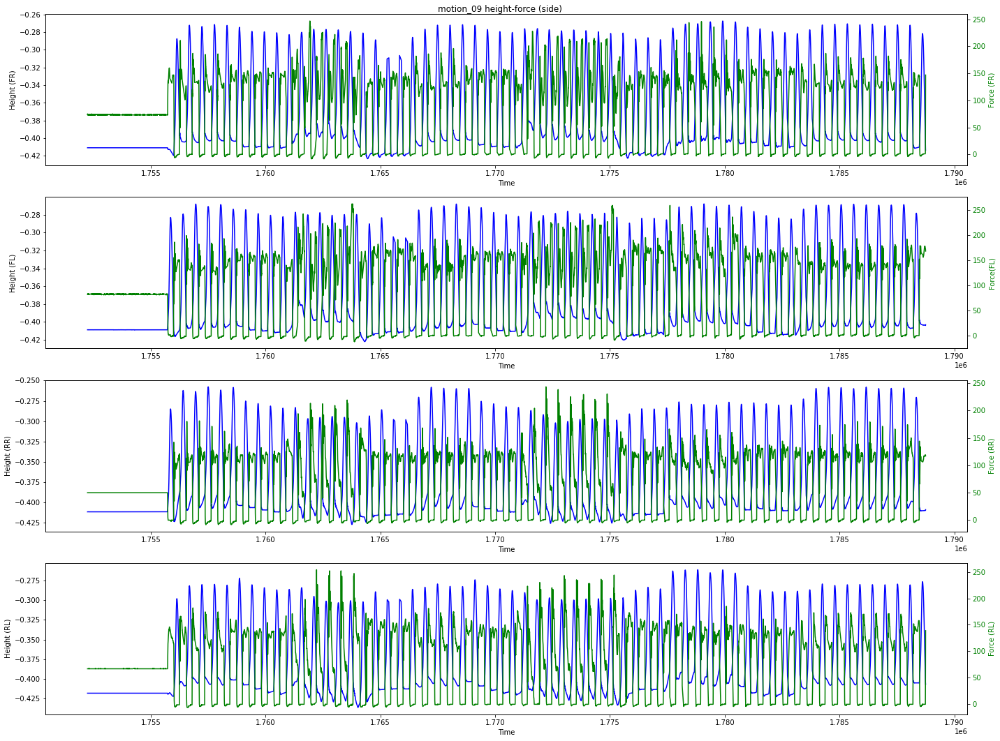

In [13]:
# Side (right)
side_cmds = get_specific_cmd(motion_09, 0, velocity, 0)
motion_09_side = motion_09[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (side)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

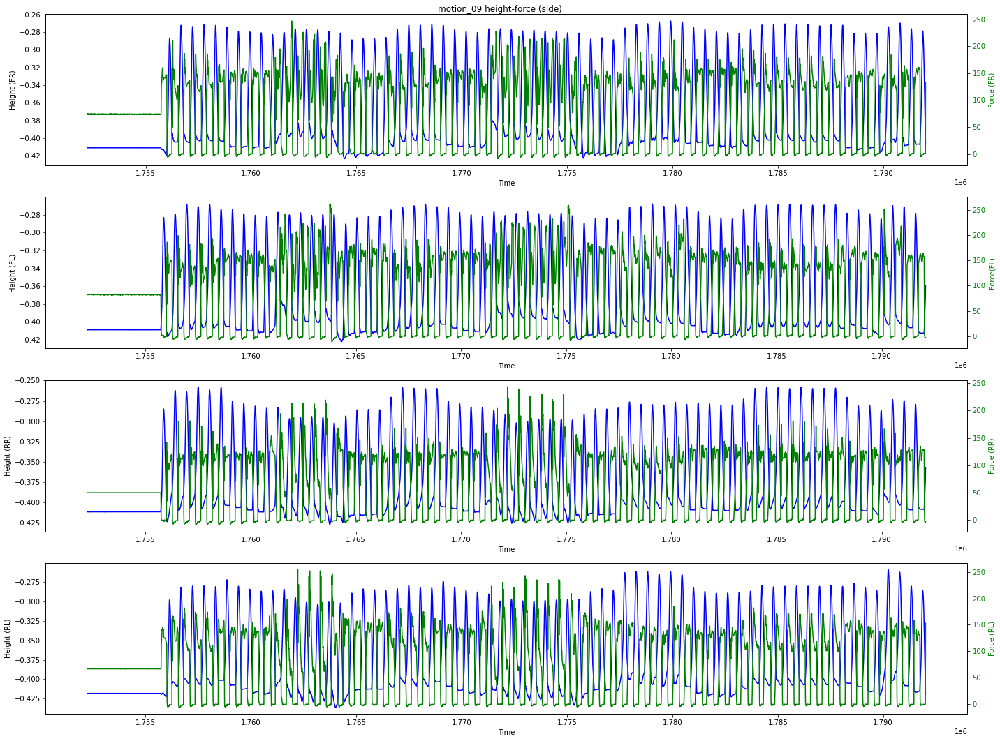

In [14]:
# Side (left)
side_cmds = get_specific_cmd(motion_09, 0, -velocity, 0)
motion_09_side = motion_09[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (side)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

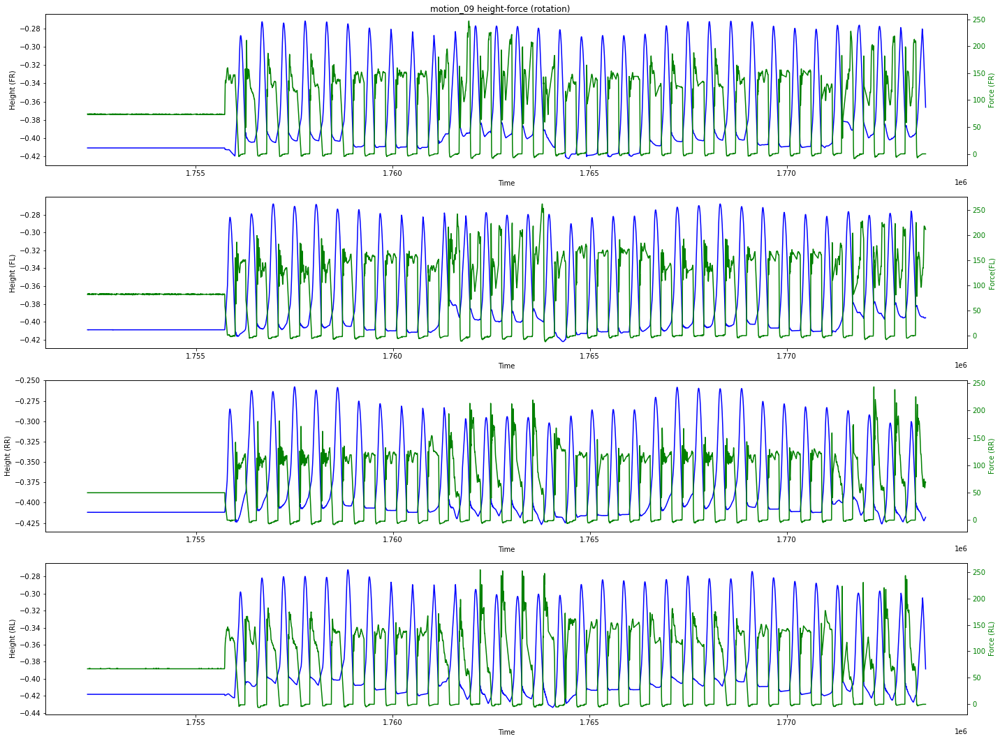

In [15]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion_09, 0, 0, velocity)
motion_09_rot = motion_09[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (rotation)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

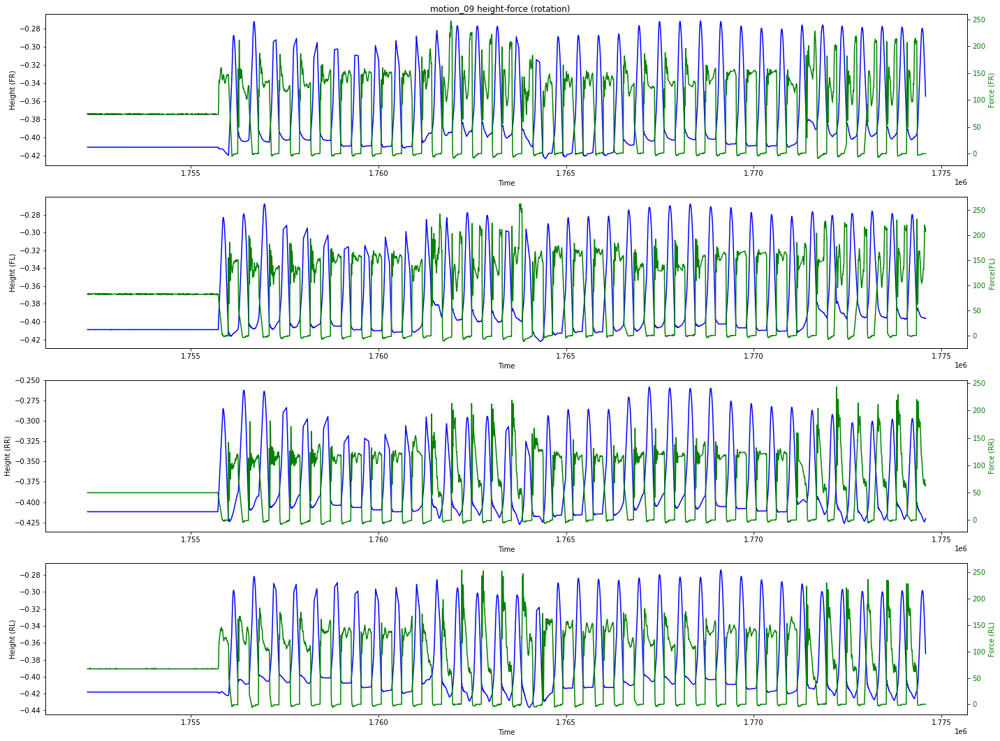

In [16]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion_09, 0, 0, -velocity)
motion_09_rot = motion_09[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_09_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_09 height-force (rotation)",
                      motion_09,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

## Footsteps Extraction (Height + Force)

In [17]:
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 34] - dataset[:, 37]), 9)

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 40] - dataset[:, 43]), 9)

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Footsteps that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with motion commands: ", footsteps_due_to_motion, "\n")
    
    # Footsteps that belong to idle mode
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with no motion commands: ", footsteps_due_to_stationarity, "\n")
    
    # FR min height (i.e swining motion)
    rear_force_footsteps = np.where(np.logical_and(dataset[:, 58] > force_thresholds[0], 
                                                   dataset[:, 59] > force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_and(dataset[:, 56] > force_thresholds[2], 
                                                    dataset[:, 57] > force_thresholds[3]))[0]

    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to motion: ", footsteps_due_to_motion, "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to no motion: ", footsteps_due_to_stationarity, "\n")
    
    return force_height_footsteps

def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    footsteps_sort, timestamps_sort = zip(*sorted(zip(footsteps, dataset[footsteps, 0])))

    for idx, footstep_sort in enumerate(footsteps_sort):
        if idx > 0:
            if abs(dataset[footstep_sort, 0] - dataset[footsteps_sort[idx-1], 0]) < 9:
                continue
            else:
                footsteps_nms.append(footstep_sort)
        else:
            footsteps_nms.append(footstep_sort)

    return np.asarray(footsteps_nms)

## Footsteps

In [18]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_09_cmds = motion_09[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_09_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_09_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_09_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]
    
    plot_overlapping_data("Footsteps",
                          motion_09_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [34, 56, 37, 57, 40, 58, 43, 59],
                           True,
                           motion_09_cmds[footsteps_nms(motion_09_cmds, footsteps), 0])
    
    return motion_09_cmds, footsteps_after_nms

### Forward motion

Foot swinging motions lenghts:  15465 15491 16924 17023
Min and max diff between front and rear feet 0.00011 0.26559 

Amount of footsteps found with height criteria:  7656 

Intersection with motion commands:  7656 

Intersection with no motion commands:  0 

Number of force footsteps:  1190 

Number of height-force footsteps:  1190 

Number of footsteps extracted with height-force due to motion:  1190 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  1190
Footsteps after non-maximum-suppression:  137


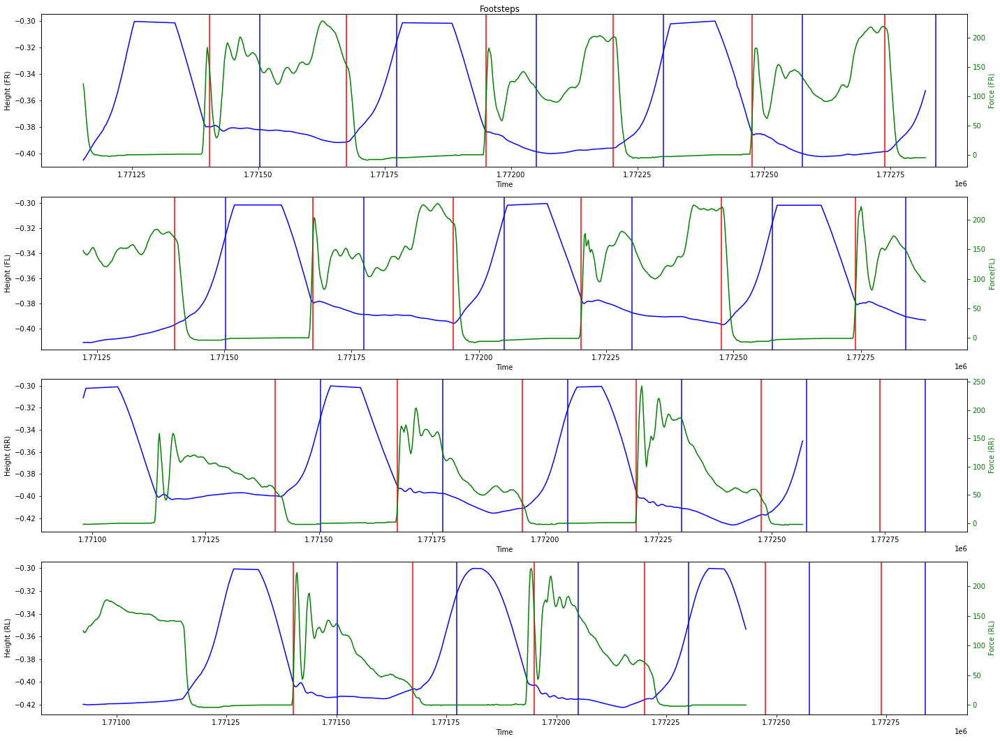

In [19]:
motion_09_fwd, footsteps_09_fwd = footstep_extraction_and_plotting(dataset=motion_09, velocities=[velocity, 0, 0], height_threshold=0.1, force_thresholds=[20,20,20,20], indexes=range(1300, 2000))

### Backward motion

Foot swinging motions lenghts:  20799 20495 19943 19980
Min and max diff between front and rear feet 0.001362 0.285421 

Amount of footsteps found with height criteria:  9432 

Intersection with motion commands:  9432 

Intersection with no motion commands:  0 

Number of force footsteps:  584 

Number of height-force footsteps:  584 

Number of footsteps extracted with height-force due to motion:  584 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  584
Footsteps after non-maximum-suppression:  172


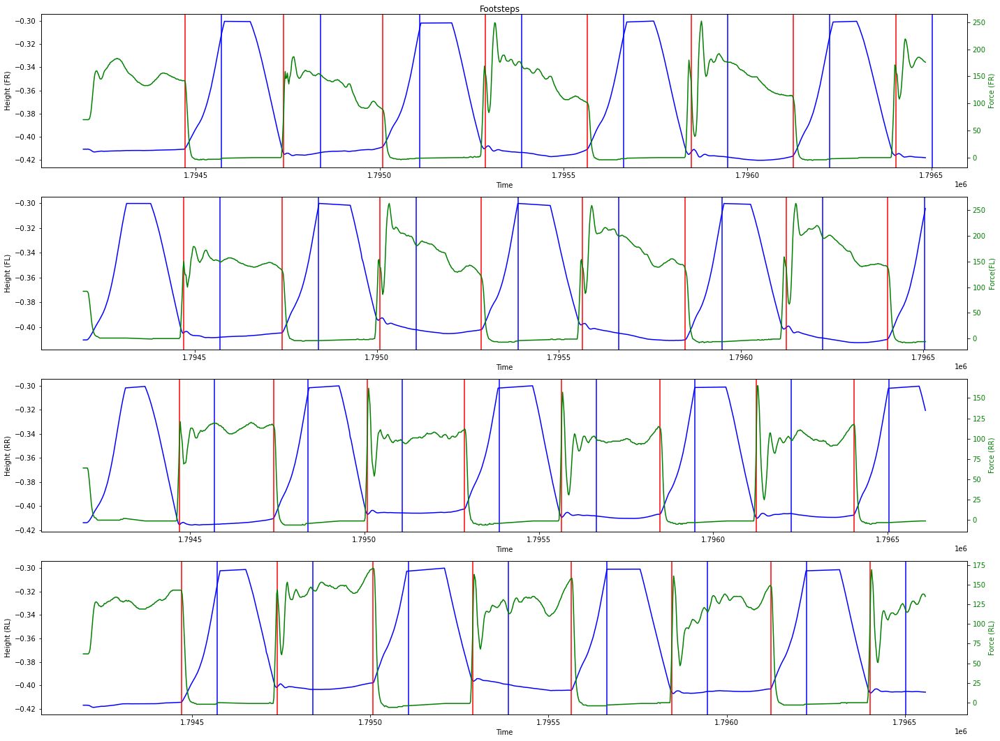

In [20]:
motion_09_bwd, footsteps_09_bwd = footstep_extraction_and_plotting(dataset=motion_09, velocities=[-velocity, 0, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 1000))

### Side motion (right)

Foot swinging motions lenghts:  15547 15440 15973 16012
Min and max diff between front and rear feet 0.000258 0.271102 

Amount of footsteps found with height criteria:  7309 

Intersection with motion commands:  7309 

Intersection with no motion commands:  0 

Number of force footsteps:  491 

Number of height-force footsteps:  491 

Number of footsteps extracted with height-force due to motion:  491 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  491
Footsteps after non-maximum-suppression:  135


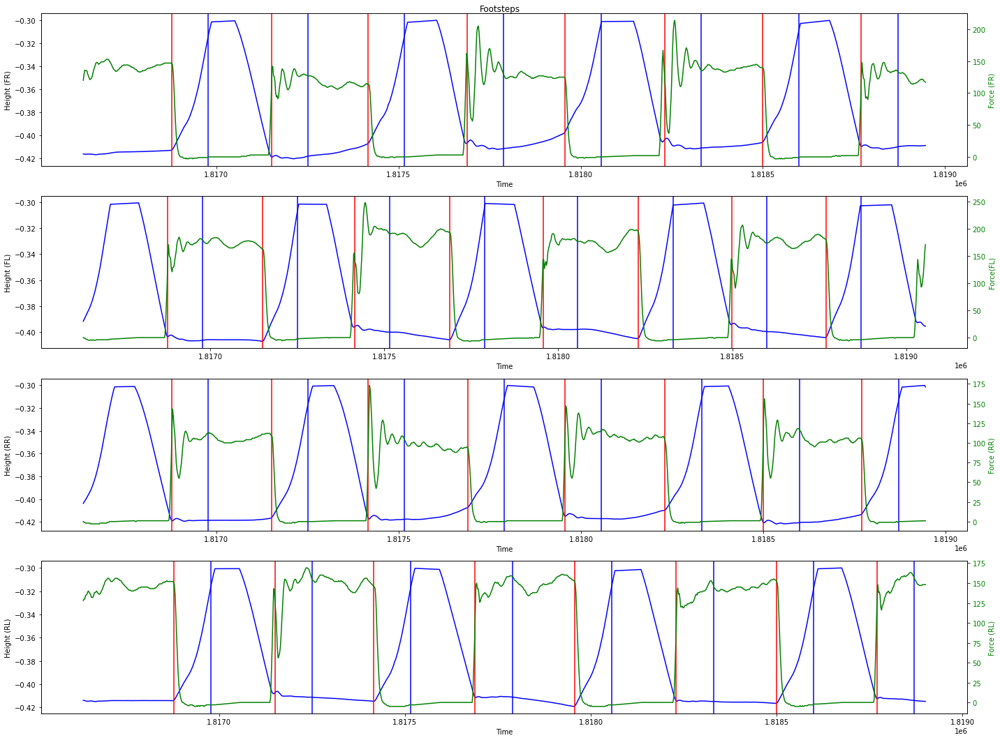

In [21]:
motion_09_side_right, footsteps_09_side_right = footstep_extraction_and_plotting(dataset=motion_09, velocities=[0, velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 1000))

### Side (left)

Foot swinging motions lenghts:  17032 17019 17085 17469
Min and max diff between front and rear feet 0.000494 0.269235 

Amount of footsteps found with height criteria:  7951 

Intersection with motion commands:  7951 

Intersection with no motion commands:  0 

Number of force footsteps:  589 

Number of height-force footsteps:  589 

Number of footsteps extracted with height-force due to motion:  589 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  589
Footsteps after non-maximum-suppression:  148


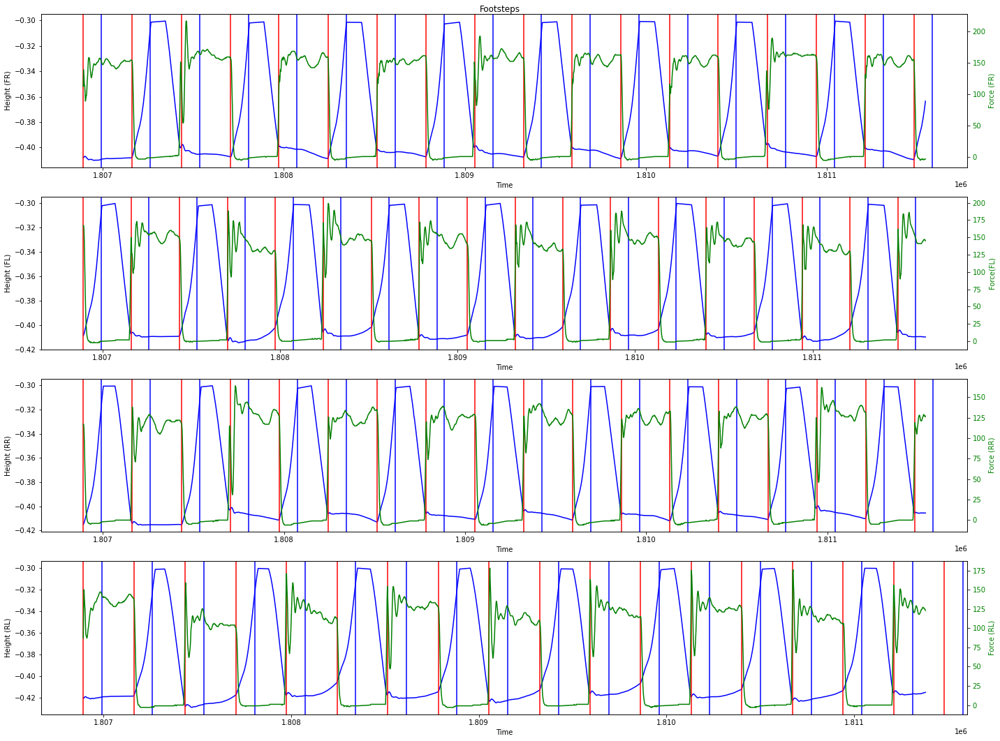

In [22]:
motion_09_side_left, footsteps_09_side_left = footstep_extraction_and_plotting(dataset=motion_09, velocities=[0, -velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 2000))

### Rotation (clockwise)

Foot swinging motions lenghts:  8789 9060 9203 8672
Min and max diff between front and rear feet 0.000493 0.272227 

Amount of footsteps found with height criteria:  4307 

Intersection with motion commands:  4307 

Intersection with no motion commands:  0 

Number of force footsteps:  223 

Number of height-force footsteps:  223 

Number of footsteps extracted with height-force due to motion:  223 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  223
Footsteps after non-maximum-suppression:  73


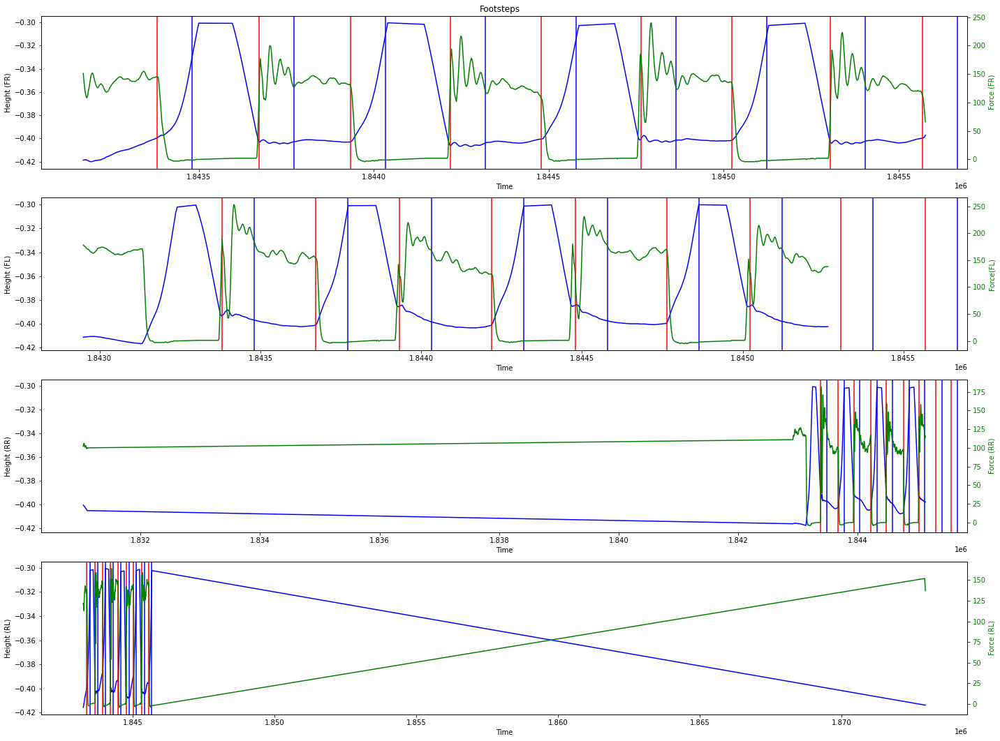

In [23]:
motion_09_clock, footsteps_09_clock = footstep_extraction_and_plotting(dataset=motion_09, velocities=[0, 0, velocity], height_threshold=0.1, force_thresholds=[90,90,90,90], indexes=range(3000, 4000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  9536 9161 9075 9829
Min and max diff between front and rear feet 0.00027 0.281544 

Amount of footsteps found with height criteria:  4478 

Intersection with motion commands:  4478 

Intersection with no motion commands:  0 

Number of force footsteps:  336 

Number of height-force footsteps:  336 

Number of footsteps extracted with height-force due to motion:  336 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  336
Footsteps after non-maximum-suppression:  81


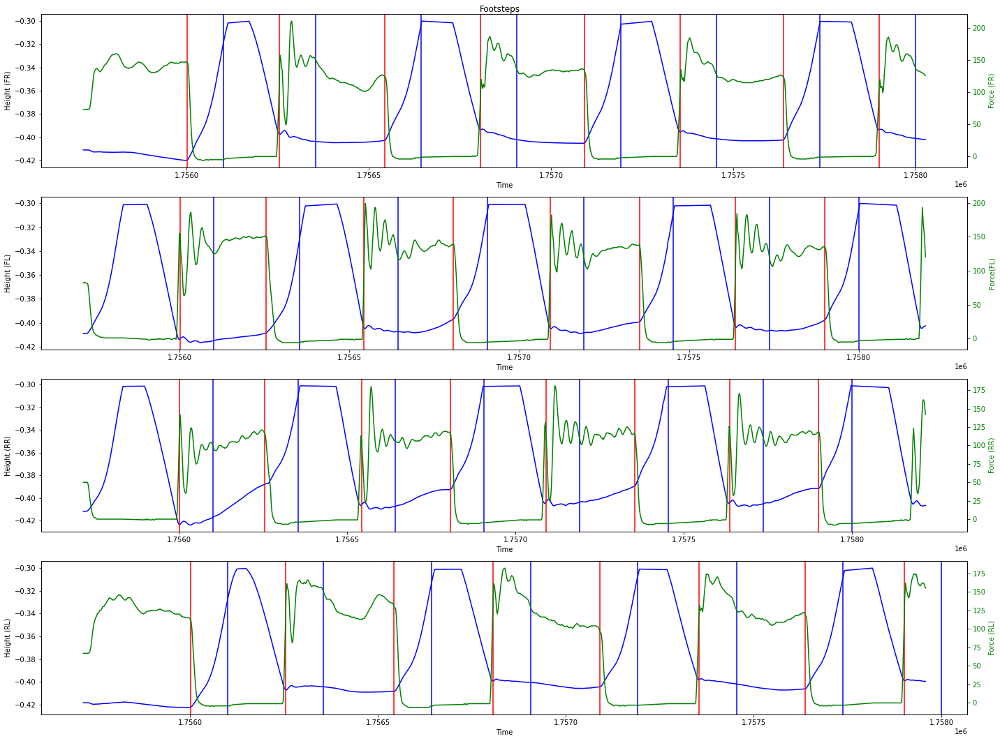

In [24]:
motion_09_count, footsteps_09_count = footstep_extraction_and_plotting(dataset=motion_09, velocities=[0, 0, -velocity], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 1000))

### Step size

In [25]:
def get_step_size(dataset, footsteps, idx_coord=[32,35,38,41]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                footstep_period.append(time_diff)
                step_size_fr.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fl.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_rr_numpy = np.array(step_size_rr)
    step_size_rl_numpy = np.array(step_size_rl)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_fl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [26]:
# Step size and velocity along x axis 
step_size_fr_x_fwd,_,_,_ = get_step_size(motion_09_fwd, footsteps_09_fwd)

Avg. step size time:  266.0483870967742
Avg. step size for FR foot:  0.2825937394827586
Avg. step size for FL foot:  0.2825937394827586
Avg. step size for RR foot:  0.2825937394827586
Avg. step size for RL foot:  0.2825937394827586 

Std. dev. step size for FR foot:  0.07839338781482384
Std. dev. step size for FL foot:  0.07839338781482384
Std. dev. step size for RR foot:  0.07839338781482384
Std. dev. step size for RL foot:  0.07839338781482384 



In [27]:
step_size_fr_x_fwd

array([0.3120855 , 0.2873476 , 0.3096535 , 0.3026406 , 0.050625  ,
       0.38604009, 0.297151  , 0.28589   , 0.3005168 , 0.3002087 ,
       0.3012145 , 0.2893078 , 0.3110835 , 0.30936   , 0.3055921 ,
       0.2755926 , 0.3146507 , 0.3015622 , 0.300478  , 0.2996198 ,
       0.2996973 , 0.293973  , 0.2998754 , 0.291838  , 0.2738873 ,
       0.3241269 , 0.3003131 , 0.3010817 , 0.019118  , 0.3692713 ,
       0.3024401 , 0.26923   , 0.2644853 , 0.3188615 , 0.3080132 ,
       0.2998148 , 0.2985445 , 0.100188  , 0.3716129 , 0.2986767 ,
       0.292531  , 0.2943    , 0.2961787 , 0.2955812 , 0.3003046 ,
       0.2962007 , 0.2940186 , 0.01951   , 0.3717135 , 0.2998736 ,
       0.022992  , 0.3746699 , 0.3009612 , 0.2494482 , 0.331818  ,
       0.3035042 , 0.3020171 , 0.2991454 ])

In [28]:
idx = np.where(step_size_fr_x_fwd > 0.1)[0]

In [29]:
np.mean(step_size_fr_x_fwd[idx])

0.301447997962963

In [30]:
np.std(step_size_fr_x_fwd[idx])

0.03786163522171708

In [31]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_fwd, footsteps_09_fwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  266.0483870967742
Avg. step size for FR foot:  0.027301864615384617
Avg. step size for FL foot:  0.027301864615384617
Avg. step size for RR foot:  0.027301864615384617
Avg. step size for RL foot:  0.027301864615384617 

Std. dev. step size for FR foot:  0.028252756574854404
Std. dev. step size for FL foot:  0.028252756574854404
Std. dev. step size for RR foot:  0.028252756574854404
Std. dev. step size for RL foot:  0.028252756574854404 



### Backward motion

In [32]:
# Step size and velocity along x axis 
step_size_fr_x_bwd,_,_,_ = get_step_size(motion_09_bwd, footsteps_09_bwd)

Avg. step size time:  276.91358024691357
Avg. step size for FR foot:  0.1279476125
Avg. step size for FL foot:  0.1279476125
Avg. step size for RR foot:  0.1279476125
Avg. step size for RL foot:  0.1279476125 

Std. dev. step size for FR foot:  0.03135971241397701
Std. dev. step size for FL foot:  0.03135971241397701
Std. dev. step size for RR foot:  0.03135971241397701
Std. dev. step size for RL foot:  0.03135971241397701 



In [33]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_bwd, footsteps_09_bwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  276.91358024691357
Avg. step size for FR foot:  0.022317574074074073
Avg. step size for FL foot:  0.022317574074074073
Avg. step size for RR foot:  0.022317574074074073
Avg. step size for RL foot:  0.022317574074074073 

Std. dev. step size for FR foot:  0.011999915198607543
Std. dev. step size for FL foot:  0.011999915198607543
Std. dev. step size for RR foot:  0.011999915198607543
Std. dev. step size for RL foot:  0.011999915198607543 



### Side motion (right)

In [34]:
# Step size and velocity along x axis 
step_size_fr_x_right,_,_,_ = get_step_size(motion_09_side_right, footsteps_09_side_right)

Avg. step size time:  270.05555555555554
Avg. step size for FR foot:  0.005654779411764705
Avg. step size for FL foot:  0.005654779411764705
Avg. step size for RR foot:  0.005654779411764705
Avg. step size for RL foot:  0.005654779411764705 

Std. dev. step size for FR foot:  0.0037148694096499
Std. dev. step size for FL foot:  0.0037148694096499
Std. dev. step size for RR foot:  0.0037148694096499
Std. dev. step size for RL foot:  0.0037148694096499 



In [35]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_side_right, footsteps_09_side_right, idx_coord=[33, 36, 39, 42])

Avg. step size time:  270.05555555555554
Avg. step size for FR foot:  0.053429032258064516
Avg. step size for FL foot:  0.053429032258064516
Avg. step size for RR foot:  0.053429032258064516
Avg. step size for RL foot:  0.053429032258064516 

Std. dev. step size for FR foot:  0.02083696171816133
Std. dev. step size for FL foot:  0.02083696171816133
Std. dev. step size for RR foot:  0.02083696171816133
Std. dev. step size for RL foot:  0.02083696171816133 



### Side motions (left)

In [36]:
# Step size and velocity along x axis 
step_size_fr_x_left,_,_,_ = get_step_size(motion_09_side_left, footsteps_09_side_left)

Avg. step size time:  269.82394366197184
Avg. step size for FR foot:  0.018834042857142862
Avg. step size for FL foot:  0.018834042857142862
Avg. step size for RR foot:  0.018834042857142862
Avg. step size for RL foot:  0.018834042857142862 

Std. dev. step size for FR foot:  0.004222665141609415
Std. dev. step size for FL foot:  0.004222665141609415
Std. dev. step size for RR foot:  0.004222665141609415
Std. dev. step size for RL foot:  0.004222665141609415 



In [37]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_side_left, footsteps_09_side_left, idx_coord=[33, 36, 39, 42])

Avg. step size time:  269.82394366197184
Avg. step size for FR foot:  0.04124390133333333
Avg. step size for FL foot:  0.04124390133333333
Avg. step size for RR foot:  0.04124390133333333
Avg. step size for RL foot:  0.04124390133333333 

Std. dev. step size for FR foot:  0.016234929817316685
Std. dev. step size for FL foot:  0.016234929817316685
Std. dev. step size for RR foot:  0.016234929817316685
Std. dev. step size for RL foot:  0.016234929817316685 



### Rotation (clockwise)

In [38]:
# Step size and velocity along x axis 
step_size_fr_x_clock,_,_,_ = get_step_size(motion_09_clock, footsteps_09_clock)

Avg. step size time:  271.41379310344826
Avg. step size for FR foot:  0.06695713793103449
Avg. step size for FL foot:  0.06695713793103449
Avg. step size for RR foot:  0.06695713793103449
Avg. step size for RL foot:  0.06695713793103449 

Std. dev. step size for FR foot:  0.02558073660437389
Std. dev. step size for FL foot:  0.02558073660437389
Std. dev. step size for RR foot:  0.02558073660437389
Std. dev. step size for RL foot:  0.02558073660437389 



In [39]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_clock, footsteps_09_clock, idx_coord=[33, 36, 39, 42])

Avg. step size time:  271.41379310344826
Avg. step size for FR foot:  0.08734127857142858
Avg. step size for FL foot:  0.08734127857142858
Avg. step size for RR foot:  0.08734127857142858
Avg. step size for RL foot:  0.08734127857142858 

Std. dev. step size for FR foot:  0.03284201718291847
Std. dev. step size for FL foot:  0.03284201718291847
Std. dev. step size for RR foot:  0.03284201718291847
Std. dev. step size for RL foot:  0.03284201718291847 



### Rotation (counter clockwise)

In [40]:
# Step size and velocity along x axis 
step_size_fr_x_count,_,_,_ = get_step_size(motion_09_count, footsteps_09_count)

Avg. step size time:  272.05797101449275
Avg. step size for FR foot:  0.037305891891891894
Avg. step size for FL foot:  0.037305891891891894
Avg. step size for RR foot:  0.037305891891891894
Avg. step size for RL foot:  0.037305891891891894 

Std. dev. step size for FR foot:  0.013092646192143016
Std. dev. step size for FL foot:  0.013092646192143016
Std. dev. step size for RR foot:  0.013092646192143016
Std. dev. step size for RL foot:  0.013092646192143016 



In [41]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_09_count, footsteps_09_count, idx_coord=[33, 36, 39, 42])

Avg. step size time:  272.05797101449275
Avg. step size for FR foot:  0.09714413514285714
Avg. step size for FL foot:  0.09714413514285714
Avg. step size for RR foot:  0.09714413514285714
Avg. step size for RL foot:  0.09714413514285714 

Std. dev. step size for FR foot:  0.016770667132638525
Std. dev. step size for FL foot:  0.016770667132638525
Std. dev. step size for RR foot:  0.016770667132638525
Std. dev. step size for RL foot:  0.016770667132638525 



### Footstep visualization

In [42]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        #if time_diff < 300:
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [43]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    new_y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    new_z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

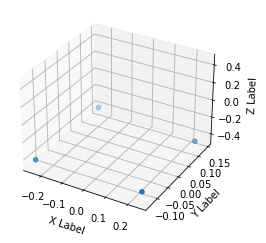

Time diff:  255.0
Footstep timestamp:  1777329.0
Height check index:  103
Height check timestamp:  1777429.0

FL moving: 0.100794. FR moving: 0.002359
RL moving: 0.0011299999999999644. RR moving: 0.10178199999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.418. FR later: -0.415641
RR moving: -0.414. RL moving: -0.313206

Coord FR: [0.234, -0.124, -0.418]. Coord FL: [0.243, 0.12, -0.414]. Coord RR: [-0.247, -0.132, -0.414]. Coord RL: [-0.245, 0.144, -0.414]

FR step_size x: 0.06563100000000002. FR step_size y: 0.093889. RL step_size x: 0.072245. RL step_size x: 0.066049.


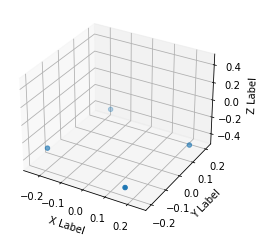

Time diff:  287.0
Footstep timestamp:  1777584.0
Height check index:  230
Height check timestamp:  1777684.0

FL moving: 0.006886000000000003. FR moving: 0.07928200000000002
RL moving: 0.08195600000000003. RR moving: 0.002356999999999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404. FR later: -0.324718
RR moving: -0.393. RL moving: -0.399886

Coord FR: [0.169, -0.207, -0.404]. Coord FL: [0.244, 0.131, -0.393]. Coord RR: [-0.241, -0.132, -0.395]. Coord RL: [-0.179, 0.21, -0.394]

FR step_size x: 0.09695499999999999. FR step_size y: 0.21929458999999998. RL step_size x: 0.10818200000000006. RL step_size x: 0.1443837.


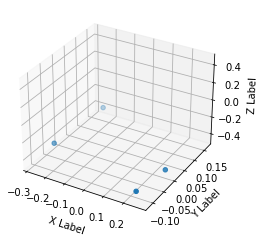

Time diff:  544.0


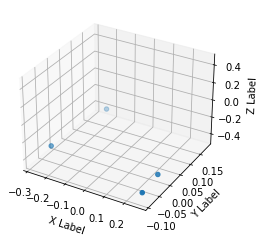

Time diff:  259.0
Footstep timestamp:  1778415.0
Height check index:  643
Height check timestamp:  1778514.0

FL moving: 0.10007700000000003. FR moving: 0.003674999999999984
RL moving: 6.20000000000065e-05. RR moving: 0.09889000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.4. FR later: -0.403675
RR moving: -0.4. RL moving: -0.299923

Coord FR: [0.266, -0.091, -0.4]. Coord FL: [0.256, -0.011, -0.4]. Coord RR: [-0.28, -0.026, -0.405]. Coord RL: [-0.233, 0.184, -0.405]

FR step_size x: 0.09112300000000004. FR step_size y: 0.259581. RL step_size x: 0.11069600000000004. RL step_size x: 0.12114.


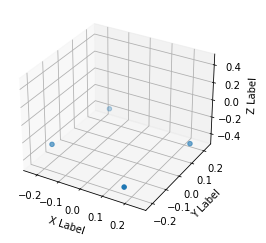

Time diff:  284.0
Footstep timestamp:  1778674.0
Height check index:  772
Height check timestamp:  1778773.0

FL moving: 0.012952999999999992. FR moving: 0.08948800000000001
RL moving: 0.08533000000000002. RR moving: 0.003952999999999984

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.312512
RR moving: -0.383. RL moving: -0.395953

Coord FR: [0.176, -0.216, -0.402]. Coord FL: [0.255, 0.146, -0.383]. Coord RR: [-0.229, -0.106, -0.395]. Coord RL: [-0.173, 0.225, -0.392]

FR step_size x: 0.09258299999999997. FR step_size y: 0.25627102999999996. RL step_size x: 0.11451200000000003. RL step_size x: 0.1199867.


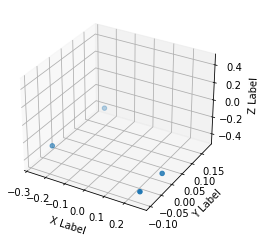

Time diff:  259.0
Footstep timestamp:  1778958.0
Height check index:  914
Height check timestamp:  1779058.0

FL moving: 0.09922800000000004. FR moving: 0.0007179999999999964
RL moving: 0.002807999999999977. RR moving: 0.09862599999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.4. FR later: -0.400718
RR moving: -0.398. RL moving: -0.298772

Coord FR: [0.254, -0.097, -0.4]. Coord FL: [0.269, -0.009, -0.398]. Coord RR: [-0.274, -0.03, -0.407]. Coord RL: [-0.243, 0.181, -0.404]

FR step_size x: 0.10705500000000004. FR step_size y: 0.28406699999999996. RL step_size x: 0.10970800000000003. RL step_size x: 0.09279770000000001.


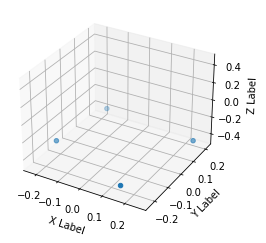

Time diff:  544.0


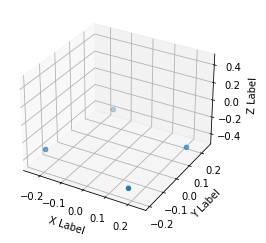

Time diff:  287.0
Footstep timestamp:  1779761.0
Height check index:  1314
Height check timestamp:  1779861.0

FL moving: 0.011417999999999984. FR moving: 0.088667
RL moving: 0.08167400000000002. RR moving: 0.0018779999999999908

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.4. FR later: -0.311333
RR moving: -0.385. RL moving: -0.396418

Coord FR: [0.182, -0.195, -0.4]. Coord FL: [0.242, 0.137, -0.385]. Coord RR: [-0.242, -0.128, -0.393]. Coord RL: [-0.167, 0.244, -0.388]

FR step_size x: 0.08971200000000001. FR step_size y: 0.207453. RL step_size x: 0.114785. RL step_size x: 0.18452600000000002.


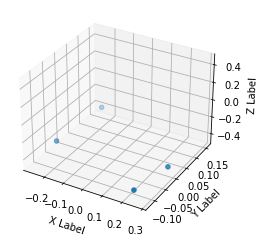

Time diff:  261.0
Footstep timestamp:  1780048.0
Height check index:  1457
Height check timestamp:  1780148.0

FL moving: 0.09835100000000002. FR moving: 0.0006800000000000139
RL moving: 0.0015560000000000018. RR moving: 0.09845300000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.403. FR later: -0.40232
RR moving: -0.4. RL moving: -0.301649

Coord FR: [0.236, -0.121, -0.403]. Coord FL: [0.277, -0.003, -0.4]. Coord RR: [-0.272, -0.033, -0.403]. Coord RL: [-0.252, 0.154, -0.404]

FR step_size x: 0.11294200000000001. FR step_size y: 0.262753. RL step_size x: 0.10283500000000004. RL step_size x: 0.11977600000000001.


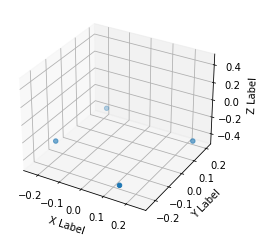

Time diff:  9526.0


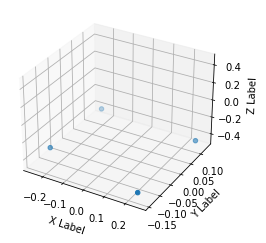

Time diff:  249.0
Footstep timestamp:  1789835.0
Height check index:  1734
Height check timestamp:  1789935.0

FL moving: 0.10295199999999999. FR moving: 0.0019379999999999953
RL moving: 0.005375999999999992. RR moving: 0.103433

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.416. FR later: -0.414062
RR moving: -0.414. RL moving: -0.311048

Coord FR: [0.236, -0.144, -0.416]. Coord FL: [0.257, 0.111, -0.414]. Coord RR: [-0.26, -0.083, -0.416]. Coord RL: [-0.242, 0.132, -0.421]

FR step_size x: 0.09714999999999999. FR step_size y: 0.05564800000000002. RL step_size x: 0.077263. RL step_size x: 0.15767399999999998.


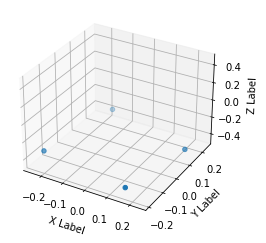

Time diff:  293.0
Footstep timestamp:  1790084.0
Height check index:  1858
Height check timestamp:  1790184.0

FL moving: 0.0061029999999999696. FR moving: 0.07337600000000005
RL moving: 0.07248300000000002. RR moving: 0.0006780000000000119

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404. FR later: -0.330624
RR moving: -0.391. RL moving: -0.397103

Coord FR: [0.161, -0.19, -0.404]. Coord FL: [0.235, 0.121, -0.391]. Coord RR: [-0.248, -0.136, -0.393]. Coord RL: [-0.177, 0.237, -0.388]

FR step_size x: 0.10744000000000004. FR step_size y: 0.18146372. RL step_size x: 0.10500999999999999. RL step_size x: 0.1944963.


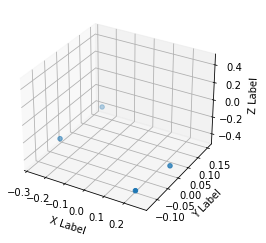

Time diff:  38120.0


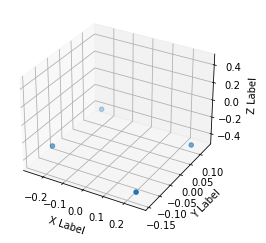

Time diff:  247.0
Footstep timestamp:  1828497.0
Height check index:  2249
Height check timestamp:  1828597.0

FL moving: 0.10347. FR moving: 0.0017459999999999698
RL moving: 0.006977000000000011. RR moving: 0.10245499999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.416. FR later: -0.414254
RR moving: -0.415. RL moving: -0.31153

Coord FR: [0.235, -0.143, -0.416]. Coord FL: [0.264, 0.092, -0.415]. Coord RR: [-0.263, -0.072, -0.418]. Coord RL: [-0.244, 0.135, -0.425]

FR step_size x: 0.10758799999999999. FR step_size y: 0.08585000000000001. RL step_size x: 0.08149900000000002. RL step_size x: 0.162543.


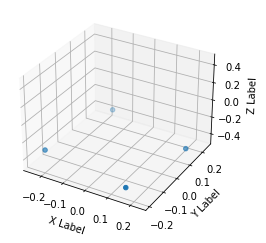

Time diff:  297.0
Footstep timestamp:  1828744.0
Height check index:  2372
Height check timestamp:  1828844.0

FL moving: 0.00615899999999997. FR moving: 0.06923300000000004
RL moving: 0.069461. RR moving: 0.0011269999999999891

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.332767
RR moving: -0.393. RL moving: -0.399159

Coord FR: [0.16, -0.194, -0.402]. Coord FL: [0.231, 0.127, -0.393]. Coord RR: [-0.248, -0.132, -0.394]. Coord RL: [-0.177, 0.237, -0.393]

FR step_size x: 0.11390999999999998. FR step_size y: 0.17503313. RL step_size x: 0.09959199999999999. RL step_size x: 0.2117455.


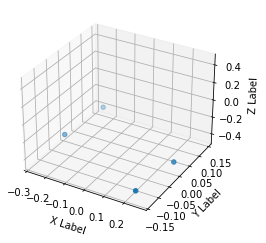

Time diff:  261.0
Footstep timestamp:  1829041.0
Height check index:  2520
Height check timestamp:  1829141.0

FL moving: 0.10112400000000005. FR moving: 0.0023920000000000052
RL moving: 0.005319999999999991. RR moving: 0.09986300000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.405. FR later: -0.402608
RR moving: -0.403. RL moving: -0.301876

Coord FR: [0.235, -0.136, -0.405]. Coord FL: [0.27, 0.01, -0.403]. Coord RR: [-0.275, -0.013, -0.399]. Coord RL: [-0.25, 0.144, -0.397]

FR step_size x: 0.108378. FR step_size y: 0.220243. RL step_size x: 0.09874700000000003. RL step_size x: 0.177909.


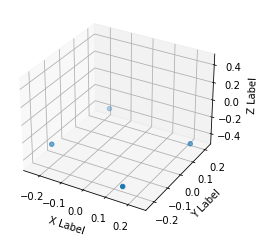

Time diff:  283.0
Footstep timestamp:  1829302.0
Height check index:  2650
Height check timestamp:  1829402.0

FL moving: 0.013454999999999995. FR moving: 0.091698
RL moving: 0.08819199999999999. RR moving: 0.0025189999999999935

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401. FR later: -0.309302
RR moving: -0.388. RL moving: -0.401455

Coord FR: [0.156, -0.228, -0.401]. Coord FL: [0.241, 0.139, -0.388]. Coord RR: [-0.241, -0.119, -0.391]. Coord RL: [-0.185, 0.216, -0.39]

FR step_size x: 0.11158099999999999. FR step_size y: 0.25879013000000006. RL step_size x: 0.09985600000000003. RL step_size x: 0.14278319999999997.


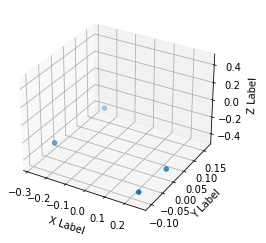

Time diff:  263.0
Footstep timestamp:  1829585.0
Height check index:  2791
Height check timestamp:  1829685.0

FL moving: 0.09765600000000002. FR moving: 0.0009530000000000372
RL moving: 0.0018539999999999668. RR moving: 0.09633000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.406. FR later: -0.405047
RR moving: -0.403. RL moving: -0.305344

Coord FR: [0.246, -0.105, -0.406]. Coord FL: [0.263, 0.003, -0.403]. Coord RR: [-0.281, -0.027, -0.403]. Coord RL: [-0.245, 0.165, -0.401]

FR step_size x: 0.09577400000000003. FR step_size y: 0.26524800000000004. RL step_size x: 0.11434600000000003. RL step_size x: 0.122722.


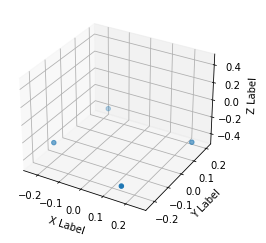

Time diff:  283.0
Footstep timestamp:  1829848.0
Height check index:  2922
Height check timestamp:  1829948.0

FL moving: 0.012593999999999994. FR moving: 0.08921500000000004
RL moving: 0.092283. RR moving: 0.004452999999999985

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401. FR later: -0.311785
RR moving: -0.388. RL moving: -0.400594

Coord FR: [0.161, -0.23, -0.401]. Coord FL: [0.252, 0.143, -0.388]. Coord RR: [-0.231, -0.109, -0.393]. Coord RL: [-0.181, 0.206, -0.394]

FR step_size x: 0.10655699999999999. FR step_size y: 0.27338039999999997. RL step_size x: 0.107261. RL step_size x: 0.11020739999999998.


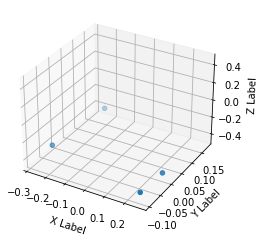

Time diff:  259.0
Footstep timestamp:  1830131.0
Height check index:  3063
Height check timestamp:  1830232.0

FL moving: 0.103188. FR moving: 0.002249000000000001
RL moving: 0.0006470000000000087. RR moving: 0.10134800000000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.405. FR later: -0.402751
RR moving: -0.402. RL moving: -0.298812

Coord FR: [0.254, -0.095, -0.405]. Coord FL: [0.265, -0.005, -0.402]. Coord RR: [-0.277, -0.027, -0.405]. Coord RL: [-0.242, 0.177, -0.404]

FR step_size x: 0.09517400000000001. FR step_size y: 0.258557. RL step_size x: 0.10882800000000001. RL step_size x: 0.125309.


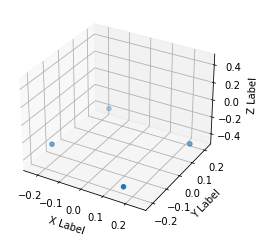

Time diff:  283.0
Footstep timestamp:  1830390.0
Height check index:  3191
Height check timestamp:  1830489.0

FL moving: 0.013195000000000012. FR moving: 0.089011
RL moving: 0.08616299999999999. RR moving: 0.004300999999999999

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401. FR later: -0.311989
RR moving: -0.385. RL moving: -0.398195

Coord FR: [0.171, -0.218, -0.401]. Coord FL: [0.253, 0.141, -0.385]. Coord RR: [-0.232, -0.109, -0.393]. Coord RL: [-0.178, 0.22, -0.391]

FR step_size x: 0.09393399999999999. FR step_size y: 0.25492539999999997. RL step_size x: 0.11139199999999999. RL step_size x: 0.11612450000000002.


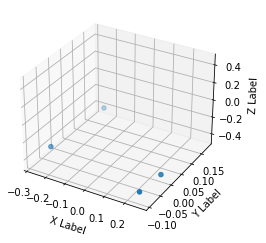

Time diff:  12459.0


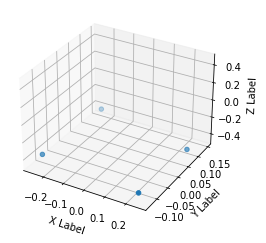

Time diff:  249.0
Footstep timestamp:  1843132.0
Height check index:  3658
Height check timestamp:  1843232.0

FL moving: 0.102688. FR moving: 0.0007270000000000332
RL moving: 0.0064629999999999965. RR moving: 0.10054399999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.416. FR later: -0.416727
RR moving: -0.417. RL moving: -0.314312

Coord FR: [0.238, -0.13, -0.416]. Coord FL: [0.255, 0.081, -0.417]. Coord RR: [-0.263, -0.102, -0.418]. Coord RL: [-0.246, 0.145, -0.424]

FR step_size x: 0.08563599999999999. FR step_size y: 0.135876. RL step_size x: 0.094506. RL step_size x: 0.09547000000000003.


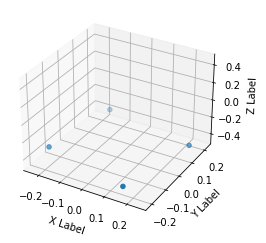

Time diff:  291.0
Footstep timestamp:  1843381.0
Height check index:  3782
Height check timestamp:  1843481.0

FL moving: 0.003980999999999957. FR moving: 0.069139
RL moving: 0.07740200000000003. RR moving: 0.0012649999999999606

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.399. FR later: -0.329861
RR moving: -0.393. RL moving: -0.396981

Coord FR: [0.162, -0.211, -0.399]. Coord FL: [0.246, 0.136, -0.393]. Coord RR: [-0.236, -0.123, -0.396]. Coord RL: [-0.178, 0.22, -0.4]

FR step_size x: 0.10527900000000001. FR step_size y: 0.22504542. RL step_size x: 0.11106900000000003. RL step_size x: 0.17004419999999998.


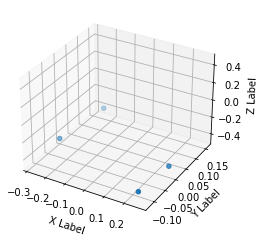

Time diff:  261.0
Footstep timestamp:  1843672.0
Height check index:  3926
Height check timestamp:  1843771.0

FL moving: 0.09720200000000001. FR moving: 2.6000000000026002e-05
RL moving: 0.003166000000000002. RR moving: 0.09701100000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.403. FR later: -0.402974
RR moving: -0.401. RL moving: -0.303798

Coord FR: [0.247, -0.118, -0.403]. Coord FL: [0.266, 0.004, -0.401]. Coord RR: [-0.278, -0.017, -0.402]. Coord RL: [-0.247, 0.156, -0.405]

FR step_size x: 0.10006100000000001. FR step_size y: 0.224511. RL step_size x: 0.10852900000000004. RL step_size x: 0.18339.


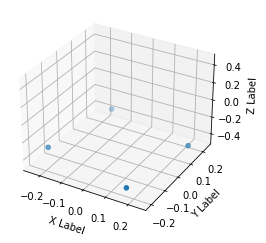

Time diff:  285.0
Footstep timestamp:  1843933.0
Height check index:  4056
Height check timestamp:  1844032.0

FL moving: 0.013527000000000011. FR moving: 0.09033100000000005
RL moving: 0.08346700000000001. RR moving: 0.003610000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.403. FR later: -0.312669
RR moving: -0.385. RL moving: -0.398527

Coord FR: [0.172, -0.208, -0.403]. Coord FL: [0.241, 0.139, -0.385]. Coord RR: [-0.242, -0.124, -0.392]. Coord RL: [-0.175, 0.233, -0.387]

FR step_size x: 0.09923400000000004. FR step_size y: 0.23193939. RL step_size x: 0.10765000000000002. RL step_size x: 0.16116650000000002.


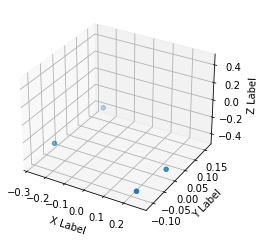

Time diff:  261.0
Footstep timestamp:  1844218.0
Height check index:  4198
Height check timestamp:  1844317.0

FL moving: 0.09689500000000001. FR moving: 0.0019010000000000415
RL moving: 0.0005000000000000004. RR moving: 0.09702900000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.406. FR later: -0.404099
RR moving: -0.401. RL moving: -0.304105

Coord FR: [0.241, -0.111, -0.406]. Coord FL: [0.271, -0.004, -0.401]. Coord RR: [-0.276, -0.034, -0.404]. Coord RL: [-0.249, 0.162, -0.402]

FR step_size x: 0.10516400000000004. FR step_size y: 0.269329. RL step_size x: 0.10785900000000001. RL step_size x: 0.10599509999999998.


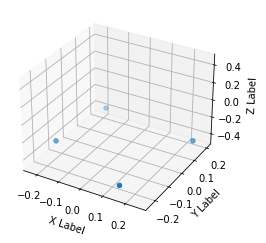

Time diff:  284.0
Footstep timestamp:  1844479.0
Height check index:  4328
Height check timestamp:  1844578.0

FL moving: 0.012587000000000015. FR moving: 0.08597000000000005
RL moving: 0.08782000000000001. RR moving: 0.005293999999999965

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.4. FR later: -0.31403
RR moving: -0.385. RL moving: -0.397587

Coord FR: [0.154, -0.236, -0.4]. Coord FL: [0.253, 0.148, -0.385]. Coord RR: [-0.228, -0.099, -0.394]. Coord RL: [-0.189, 0.203, -0.394]

FR step_size x: 0.11565299999999998. FR step_size y: 0.28627964. RL step_size x: 0.097714. RL step_size x: 0.10086410000000001.


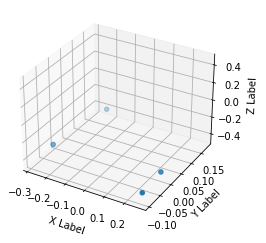

Time diff:  259.0
Footstep timestamp:  1844763.0
Height check index:  4470
Height check timestamp:  1844863.0

FL moving: 0.099991. FR moving: 0.0005269999999999997
RL moving: 0.0004870000000000152. RR moving: 0.09987199999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.401. FR later: -0.401527
RR moving: -0.4. RL moving: -0.300009

Coord FR: [0.265, -0.095, -0.401]. Coord FL: [0.257, -0.003, -0.4]. Coord RR: [-0.281, -0.022, -0.407]. Coord RL: [-0.233, 0.179, -0.407]

FR step_size x: 0.09260600000000002. FR step_size y: 0.250917. RL step_size x: 0.10803200000000002. RL step_size x: 0.14722300000000002.


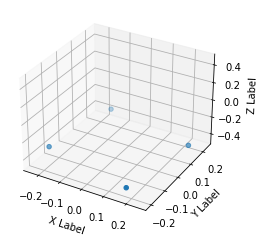

Time diff:  283.0
Footstep timestamp:  1845022.0
Height check index:  4599
Height check timestamp:  1845122.0

FL moving: 0.013064999999999993. FR moving: 0.08993700000000004
RL moving: 0.084735. RR moving: 0.0035079999999999556

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.312063
RR moving: -0.385. RL moving: -0.398065

Coord FR: [0.18, -0.206, -0.402]. Coord FL: [0.25, 0.142, -0.385]. Coord RR: [-0.235, -0.116, -0.394]. Coord RL: [-0.171, 0.233, -0.39]

FR step_size x: 0.08787400000000004. FR step_size y: 0.23430438999999997. RL step_size x: 0.115725. RL step_size x: 0.14570770000000002.


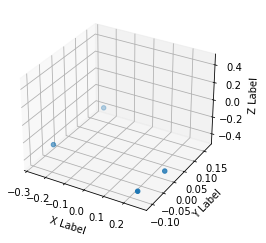

Time diff:  263.0
Footstep timestamp:  1845305.0
Height check index:  4740
Height check timestamp:  1845405.0

FL moving: 0.09806600000000004. FR moving: 0.0007220000000000004
RL moving: 0.0013139999999999818. RR moving: 0.097219

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.403. FR later: -0.402278
RR moving: -0.401. RL moving: -0.302934

Coord FR: [0.246, -0.106, -0.403]. Coord FL: [0.272, -0.007, -0.401]. Coord RR: [-0.274, -0.035, -0.405]. Coord RL: [-0.247, 0.168, -0.403]

FR step_size x: 0.10667100000000004. FR step_size y: 0.274035. RL step_size x: 0.10925900000000002. RL step_size x: 0.10147919999999999.


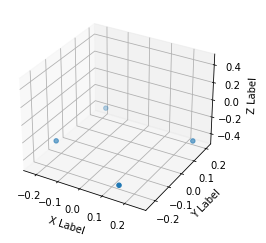

Time diff:  27506.0


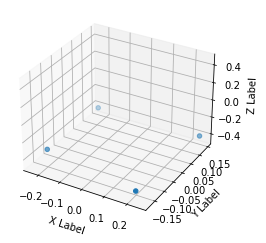

Time diff:  277.0
Footstep timestamp:  1873074.0
Height check index:  5022
Height check timestamp:  1873174.0

FL moving: 0.004976999999999954. FR moving: 0.09313500000000002
RL moving: 0.09651799999999999. RR moving: 0.0010720000000000174

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.405. FR later: -0.311865
RR moving: -0.406. RL moving: -0.410977

Coord FR: [0.218, -0.174, -0.405]. Coord FL: [0.246, 0.144, -0.406]. Coord RR: [-0.234, -0.118, -0.407]. Coord RL: [-0.231, 0.141, -0.412]

FR step_size x: 0.04613700000000001. FR step_size y: 0.14202249999999997. RL step_size x: 0.05683599999999997. RL step_size x: 0.11903156999999998.


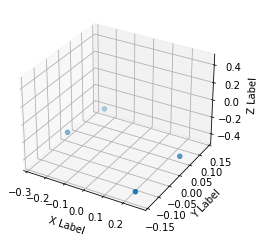

Time diff:  251.0
Footstep timestamp:  1873351.0
Height check index:  5160
Height check timestamp:  1873451.0

FL moving: 0.104155. FR moving: 0.0025299999999999767
RL moving: 0.005420999999999954. RR moving: 0.10104400000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414. FR later: -0.41147
RR moving: -0.413. RL moving: -0.308845

Coord FR: [0.238, -0.138, -0.414]. Coord FL: [0.272, 0.038, -0.413]. Coord RR: [-0.279, -0.002, -0.406]. Coord RL: [-0.243, 0.138, -0.41]

FR step_size x: 0.112703. FR step_size y: 0.132853. RL step_size x: 0.09883100000000003. RL step_size x: 0.240261.


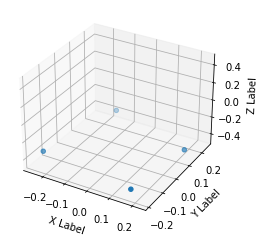

Time diff:  291.0
Footstep timestamp:  1873602.0
Height check index:  5285
Height check timestamp:  1873702.0

FL moving: 0.008307999999999982. FR moving: 0.078102
RL moving: 0.07454900000000003. RR moving: 0.0023110000000000075

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.323898
RR moving: -0.39. RL moving: -0.398308

Coord FR: [0.174, -0.189, -0.402]. Coord FL: [0.223, 0.12, -0.39]. Coord RR: [-0.256, -0.139, -0.39]. Coord RL: [-0.167, 0.241, -0.387]

FR step_size x: 0.10032400000000002. FR step_size y: 0.16147074. RL step_size x: 0.11070699999999997. RL step_size x: 0.2227847.


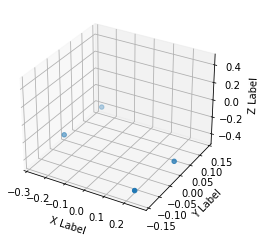

Time diff:  263.0
Footstep timestamp:  1873893.0
Height check index:  5430
Height check timestamp:  1873993.0

FL moving: 0.099443. FR moving: 0.001379000000000019
RL moving: 0.0025179999999999647. RR moving: 0.09902900000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.405. FR later: -0.403621
RR moving: -0.401. RL moving: -0.301557

Coord FR: [0.229, -0.14, -0.405]. Coord FL: [0.268, 0.008, -0.401]. Coord RR: [-0.276, -0.019, -0.399]. Coord RL: [-0.258, 0.139, -0.399]

FR step_size x: 0.10843900000000001. FR step_size y: 0.22842799999999996. RL step_size x: 0.10138500000000003. RL step_size x: 0.16188999999999998.


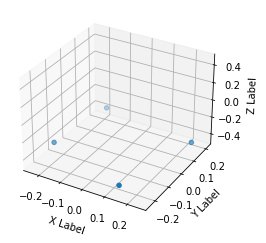

Time diff:  283.0
Footstep timestamp:  1874156.0
Height check index:  5560
Height check timestamp:  1874255.0

FL moving: 0.013703999999999994. FR moving: 0.08915500000000004
RL moving: 0.08765. RR moving: 0.0033969999999999834

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401. FR later: -0.311845
RR moving: -0.385. RL moving: -0.398704

Coord FR: [0.144, -0.235, -0.401]. Coord FL: [0.245, 0.141, -0.385]. Coord RR: [-0.237, -0.11, -0.392]. Coord RL: [-0.195, 0.209, -0.39]

FR step_size x: 0.12545200000000004. FR step_size y: 0.27320101999999996. RL step_size x: 0.09221900000000002. RL step_size x: 0.11349970000000001.


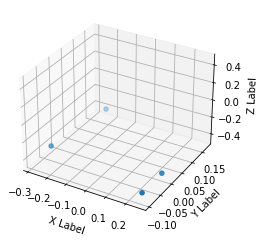

Time diff:  257.0
Footstep timestamp:  1874439.0
Height check index:  5701
Height check timestamp:  1874538.0

FL moving: 0.09925800000000001. FR moving: 0.00025200000000003
RL moving: 0.0015319999999999778. RR moving: 0.09773600000000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.402. FR later: -0.401748
RR moving: -0.401. RL moving: -0.301742

Coord FR: [0.257, -0.095, -0.402]. Coord FL: [0.258, -0.008, -0.401]. Coord RR: [-0.284, -0.032, -0.405]. Coord RL: [-0.24, 0.173, -0.407]

FR step_size x: 0.08794500000000002. FR step_size y: 0.24093299999999998. RL step_size x: 0.11448699999999998. RL step_size x: 0.14328300000000002.


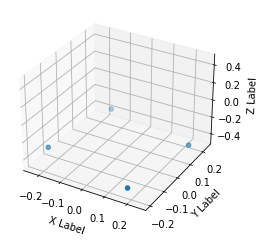

Time diff:  285.0
Footstep timestamp:  1874696.0
Height check index:  5829
Height check timestamp:  1874795.0

FL moving: 0.01339499999999999. FR moving: 0.08985300000000002
RL moving: 0.082208. RR moving: 0.0016430000000000056

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401. FR later: -0.311147
RR moving: -0.385. RL moving: -0.398395

Coord FR: [0.182, -0.199, -0.401]. Coord FL: [0.246, 0.145, -0.385]. Coord RR: [-0.237, -0.116, -0.393]. Coord RL: [-0.172, 0.233, -0.388]

FR step_size x: 0.08565600000000004. FR step_size y: 0.22828632999999998. RL step_size x: 0.11370900000000006. RL step_size x: 0.1528528.


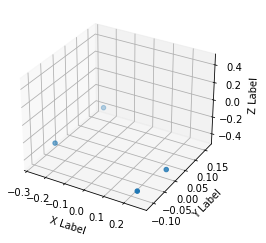

Time diff:  25437.0


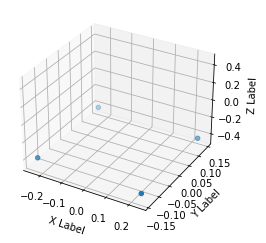

Time diff:  273.0
Footstep timestamp:  1900418.0
Height check index:  6053
Height check timestamp:  1900519.0

FL moving: 0.0016020000000000478. FR moving: 0.10237399999999997
RL moving: 0.10217899999999996. RR moving: 0.0006480000000000374

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.413. FR later: -0.310626
RR moving: -0.411. RL moving: -0.412602

Coord FR: [0.234, -0.141, -0.413]. Coord FL: [0.238, 0.134, -0.411]. Coord RR: [-0.242, -0.132, -0.412]. Coord RL: [-0.241, 0.144, -0.414]

FR step_size x: 0.03136799999999998. FR step_size y: 0.06020040000000003. RL step_size x: 0.027540000000000037. RL step_size x: 0.07427360000000001.


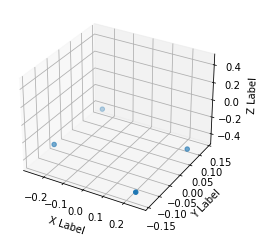

Time diff:  249.0
Footstep timestamp:  1900691.0
Height check index:  6188
Height check timestamp:  1900790.0

FL moving: 0.10060399999999997. FR moving: 0.0012559999999999794
RL moving: 0.005566999999999989. RR moving: 0.09892599999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.418. FR later: -0.416744
RR moving: -0.416. RL moving: -0.315396

Coord FR: [0.236, -0.142, -0.418]. Coord FL: [0.267, 0.075, -0.416]. Coord RR: [-0.267, -0.063, -0.417]. Coord RL: [-0.244, 0.139, -0.421]

FR step_size x: 0.10406499999999999. FR step_size y: 0.11384600000000002. RL step_size x: 0.09222100000000003. RL step_size x: 0.158675.


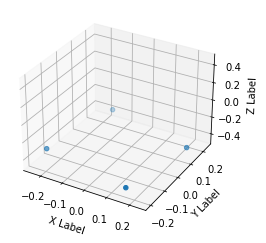

Time diff:  293.0
Footstep timestamp:  1900940.0
Height check index:  6312
Height check timestamp:  1901039.0

FL moving: 0.006396999999999986. FR moving: 0.06961400000000001
RL moving: 0.07100800000000002. RR moving: 0.00028800000000001047

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.403. FR later: -0.333386
RR moving: -0.391. RL moving: -0.397397

Coord FR: [0.164, -0.203, -0.403]. Coord FL: [0.235, 0.127, -0.391]. Coord RR: [-0.245, -0.13, -0.394]. Coord RL: [-0.174, 0.231, -0.392]

FR step_size x: 0.10100700000000001. FR step_size y: 0.20967167000000003. RL step_size x: 0.11288400000000004. RL step_size x: 0.183378.


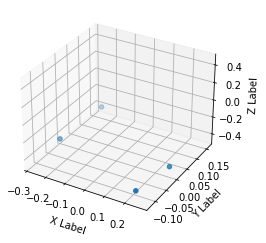

Time diff:  10617.0


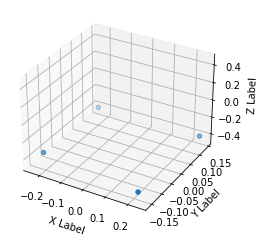

Time diff:  279.0
Footstep timestamp:  1911850.0
Height check index:  6642
Height check timestamp:  1911950.0

FL moving: 0.004718. FR moving: 0.09427799999999997
RL moving: 0.09353799999999995. RR moving: 0.0030890000000000084

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.408. FR later: -0.313722
RR moving: -0.407. RL moving: -0.411718

Coord FR: [0.224, -0.157, -0.408]. Coord FL: [0.242, 0.141, -0.407]. Coord RR: [-0.24, -0.121, -0.408]. Coord RL: [-0.239, 0.141, -0.414]

FR step_size x: 0.04012300000000002. FR step_size y: 0.1223708. RL step_size x: 0.044688000000000005. RL step_size x: 0.10931649999999997.


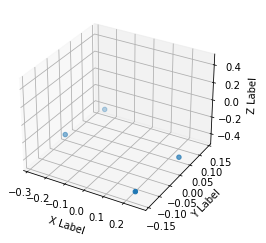

Time diff:  249.0
Footstep timestamp:  1912129.0
Height check index:  6781
Height check timestamp:  1912229.0

FL moving: 0.10386999999999996. FR moving: 0.0010189999999999921
RL moving: 0.006857999999999975. RR moving: 0.10105299999999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.413. FR later: -0.411981
RR moving: -0.414. RL moving: -0.31013

Coord FR: [0.236, -0.142, -0.413]. Coord FL: [0.27, 0.033, -0.414]. Coord RR: [-0.28, -0.014, -0.41]. Coord RL: [-0.243, 0.139, -0.416]

FR step_size x: 0.10938600000000001. FR step_size y: 0.14382000000000003. RL step_size x: 0.10247800000000004. RL step_size x: 0.219576.


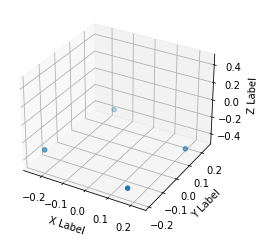

Time diff:  297.0
Footstep timestamp:  1912378.0
Height check index:  6905
Height check timestamp:  1912478.0

FL moving: 0.00953499999999996. FR moving: 0.07257400000000003
RL moving: 0.070467. RR moving: 0.001562999999999981

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.329426
RR moving: -0.389. RL moving: -0.398535

Coord FR: [0.167, -0.191, -0.402]. Coord FL: [0.23, 0.127, -0.389]. Coord RR: [-0.249, -0.131, -0.389]. Coord RL: [-0.171, 0.241, -0.386]

FR step_size x: 0.10520599999999997. FR step_size y: 0.17650331. RL step_size x: 0.10608699999999996. RL step_size x: 0.21319919999999998.


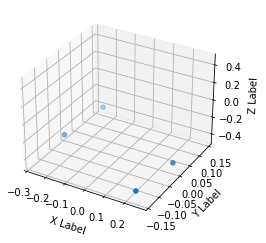

Time diff:  46409.0


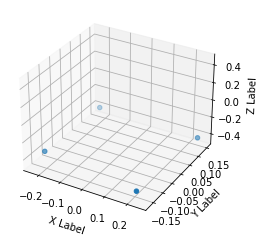

Time diff:  277.0
Footstep timestamp:  1959084.0
Height check index:  7186
Height check timestamp:  1959184.0

FL moving: 0.003920999999999952. FR moving: 0.09373100000000001
RL moving: 0.09469799999999995. RR moving: 0.0017719999999999958

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404. FR later: -0.310269
RR moving: -0.404. RL moving: -0.407921

Coord FR: [0.22, -0.166, -0.404]. Coord FL: [0.245, 0.139, -0.404]. Coord RR: [-0.236, -0.122, -0.406]. Coord RL: [-0.228, 0.151, -0.411]

FR step_size x: 0.04844000000000001. FR step_size y: 0.13792820000000003. RL step_size x: 0.055666999999999994. RL step_size x: 0.12487133999999998.


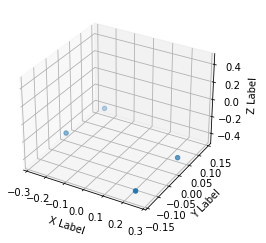

Time diff:  253.0
Footstep timestamp:  1959361.0
Height check index:  7324
Height check timestamp:  1959461.0

FL moving: 0.10333699999999996. FR moving: 0.002766999999999964
RL moving: 0.005264999999999964. RR moving: 0.10108700000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.41. FR later: -0.407233
RR moving: -0.409. RL moving: -0.305663

Coord FR: [0.24, -0.137, -0.41]. Coord FL: [0.273, 0.03, -0.409]. Coord RR: [-0.278, -0.006, -0.406]. Coord RL: [-0.242, 0.142, -0.41]

FR step_size x: 0.11269000000000001. FR step_size y: 0.152718. RL step_size x: 0.09887399999999999. RL step_size x: 0.225726.


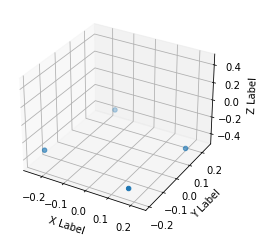

Time diff:  291.0
Footstep timestamp:  1959614.0
Height check index:  7450
Height check timestamp:  1959714.0

FL moving: 0.010365000000000013. FR moving: 0.08173200000000003
RL moving: 0.07594100000000004. RR moving: 0.0015310000000000046

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.320268
RR moving: -0.388. RL moving: -0.398365

Coord FR: [0.171, -0.193, -0.402]. Coord FL: [0.23, 0.127, -0.388]. Coord RR: [-0.252, -0.134, -0.391]. Coord RL: [-0.169, 0.239, -0.386]

FR step_size x: 0.10050299999999998. FR step_size y: 0.18074488000000002. RL step_size x: 0.10874899999999996. RL step_size x: 0.20873750000000002.


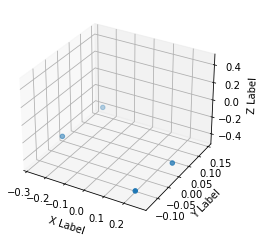

Time diff:  261.0
Footstep timestamp:  1959905.0
Height check index:  7595
Height check timestamp:  1960005.0

FL moving: 0.09960100000000005. FR moving: 0.003212000000000048
RL moving: 0.003565999999999958. RR moving: 0.09884400000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.406. FR later: -0.402788
RR moving: -0.402. RL moving: -0.302399

Coord FR: [0.233, -0.133, -0.406]. Coord FL: [0.268, 0.006, -0.402]. Coord RR: [-0.277, -0.02, -0.401]. Coord RL: [-0.252, 0.144, -0.399]

FR step_size x: 0.10791800000000004. FR step_size y: 0.24040099999999998. RL step_size x: 0.10058600000000004. RL step_size x: 0.15069800000000003.


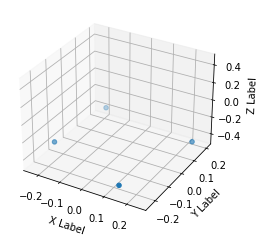

Time diff:  95109.0


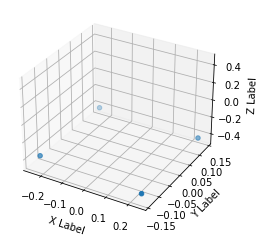

Time diff:  255.0
Footstep timestamp:  2055275.0
Height check index:  7899
Height check timestamp:  2055374.0

FL moving: 0.09872399999999998. FR moving: 0.00047999999999998044
RL moving: 0.001456999999999986. RR moving: 0.10041099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414. FR later: -0.41352
RR moving: -0.412. RL moving: -0.313276

Coord FR: [0.238, -0.14, -0.414]. Coord FL: [0.241, 0.131, -0.412]. Coord RR: [-0.247, -0.121, -0.412]. Coord RL: [-0.24, 0.139, -0.414]

FR step_size x: 0.07108799999999998. FR step_size y: 0.05785199999999999. RL step_size x: 0.063664. RL step_size x: 0.10063999999999998.


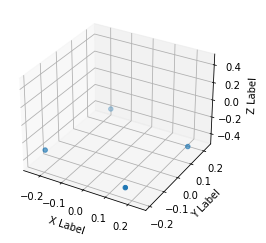

Time diff:  291.0
Footstep timestamp:  2055530.0
Height check index:  8026
Height check timestamp:  2055629.0

FL moving: 0.007635000000000003. FR moving: 0.08045800000000003
RL moving: 0.07539299999999999. RR moving: 0.0006280000000000174

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404. FR later: -0.323542
RR moving: -0.392. RL moving: -0.399635

Coord FR: [0.168, -0.196, -0.404]. Coord FL: [0.242, 0.133, -0.392]. Coord RR: [-0.243, -0.135, -0.395]. Coord RL: [-0.18, 0.225, -0.389]

FR step_size x: 0.10438599999999998. FR step_size y: 0.21031100800000002. RL step_size x: 0.10222799999999999. RL step_size x: 0.16968270000000002.


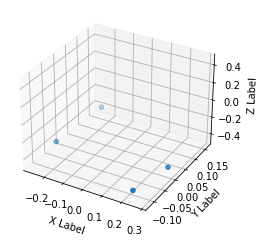

Time diff:  545.0


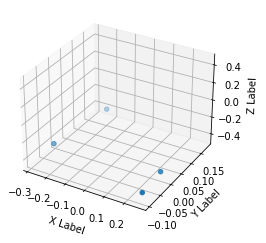

Time diff:  259.0
Footstep timestamp:  2056366.0
Height check index:  8443
Height check timestamp:  2056466.0

FL moving: 0.10052900000000003. FR moving: 0.0030769999999999964
RL moving: 9.999999999998899e-05. RR moving: 0.10115700000000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.399. FR later: -0.402077
RR moving: -0.399. RL moving: -0.298471

Coord FR: [0.266, -0.096, -0.399]. Coord FL: [0.256, -0.003, -0.399]. Coord RR: [-0.281, -0.019, -0.406]. Coord RL: [-0.233, 0.18, -0.406]

FR step_size x: 0.09149200000000002. FR step_size y: 0.24488300000000002. RL step_size x: 0.11025700000000005. RL step_size x: 0.155867.


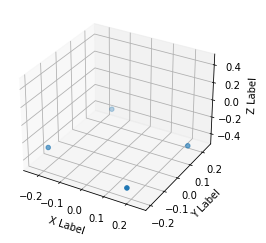

Time diff:  283.0
Footstep timestamp:  2056625.0
Height check index:  8560
Height check timestamp:  2056701.0

FL moving: 0.011565999999999965. FR moving: 0.052506
RL moving: 0.04951300000000003. RR moving: 0.0025029999999999775

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402. FR later: -0.349494
RR moving: -0.383. RL moving: -0.394566

Coord FR: [0.182, -0.202, -0.402]. Coord FL: [0.249, 0.141, -0.383]. Coord RR: [-0.236, -0.118, -0.395]. Coord RL: [-0.168, 0.237, -0.388]

FR step_size x: 0.08446999999999999. FR step_size y: 0.2187149. RL step_size x: 0.108066. RL step_size x: 0.10486429999999997.


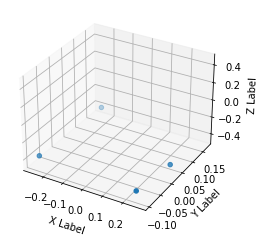

Time diff:  259.0
Footstep timestamp:  2056908.0
Height check index:  8653
Height check timestamp:  2057008.0

FL moving: 0.10336300000000004. FR moving: 0.0010459999999999914
RL moving: 0.0019479999999999498. RR moving: 0.10234300000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.402. FR later: -0.403046
RR moving: -0.398. RL moving: -0.294637

Coord FR: [0.243, -0.095, -0.402]. Coord FL: [0.272, 0.029, -0.398]. Coord RR: [-0.265, -0.08, -0.405]. Coord RL: [-0.247, 0.17, -0.404]

FR step_size x: 0.08996300000000002. FR step_size y: 0.23470800000000003. RL step_size x: 0.09326300000000001. RL step_size x: 0.06446199999999998.


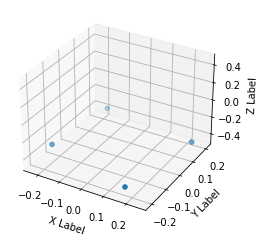

Time diff:  285.0
Footstep timestamp:  2057167.0
Height check index:  8782
Height check timestamp:  2057267.0

FL moving: 0.01134799999999997. FR moving: 0.09000200000000003
RL moving: 0.08482100000000004. RR moving: 0.0036319999999999686

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398. FR later: -0.307998
RR moving: -0.386. RL moving: -0.397348

Coord FR: [0.175, -0.211, -0.398]. Coord FL: [0.25, 0.148, -0.386]. Coord RR: [-0.232, -0.106, -0.396]. Coord RL: [-0.187, 0.209, -0.395]

FR step_size x: 0.09653099999999998. FR step_size y: 0.25766553. RL step_size x: 0.09813400000000003. RL step_size x: 0.1131343.


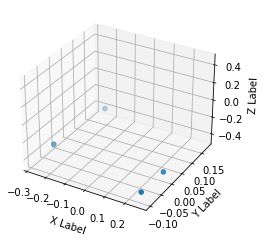

Time diff:  259.0
Footstep timestamp:  2057452.0
Height check index:  8924
Height check timestamp:  2057552.0

FL moving: 0.09860400000000002. FR moving: 0.0010939999999999839
RL moving: 0.0010470000000000201. RR moving: 0.09842399999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.399. FR later: -0.400094
RR moving: -0.399. RL moving: -0.300396

Coord FR: [0.257, -0.098, -0.399]. Coord FL: [0.264, -0.003, -0.399]. Coord RR: [-0.276, -0.023, -0.407]. Coord RL: [-0.241, 0.179, -0.407]

FR step_size x: 0.09997900000000001. FR step_size y: 0.24853999999999998. RL step_size x: 0.107021. RL step_size x: 0.148117.


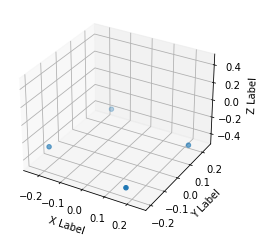

Time diff:  287.0
Footstep timestamp:  2057711.0
Height check index:  9053
Height check timestamp:  2057811.0

FL moving: 0.014878000000000002. FR moving: 0.090918
RL moving: 0.07786700000000002. RR moving: 0.0023039999999999727

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.403. FR later: -0.312082
RR moving: -0.383. RL moving: -0.397878

Coord FR: [0.175, -0.203, -0.403]. Coord FL: [0.246, 0.146, -0.383]. Coord RR: [-0.238, -0.113, -0.395]. Coord RL: [-0.172, 0.237, -0.389]

FR step_size x: 0.09641000000000002. FR step_size y: 0.23895128. RL step_size x: 0.11345100000000002. RL step_size x: 0.1461693.


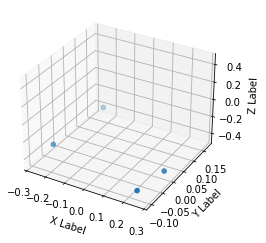

Time diff:  259.0
Footstep timestamp:  2057998.0
Height check index:  9196
Height check timestamp:  2058098.0

FL moving: 0.10081000000000001. FR moving: 0.002695000000000003
RL moving: 0.0002769999999999717. RR moving: 0.10027900000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.404. FR later: -0.401305
RR moving: -0.4. RL moving: -0.29919

Coord FR: [0.244, -0.103, -0.404]. Coord FL: [0.273, -0.007, -0.4]. Coord RR: [-0.274, -0.033, -0.406]. Coord RL: [-0.249, 0.17, -0.406]

FR step_size x: 0.10598800000000003. FR step_size y: 0.27893799999999996. RL step_size x: 0.10916300000000001. RL step_size x: 0.09699069999999997.


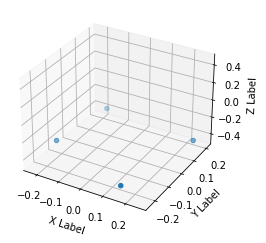

Time diff:  33827.0


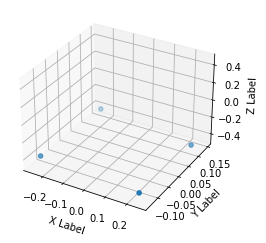

Time diff:  251.0
Footstep timestamp:  2092084.0
Height check index:  9419
Height check timestamp:  2092183.0

FL moving: 0.100574. FR moving: 0.00021500000000002073
RL moving: 0.003430999999999962. RR moving: 0.098995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414. FR later: -0.414215
RR moving: -0.414. RL moving: -0.313426

Coord FR: [0.236, -0.135, -0.414]. Coord FL: [0.25, 0.101, -0.414]. Coord RR: [-0.258, -0.114, -0.419]. Coord RL: [-0.244, 0.145, -0.424]

FR step_size x: 0.07774999999999999. FR step_size y: 0.105931. RL step_size x: 0.089643. RL step_size x: 0.08956499999999999.


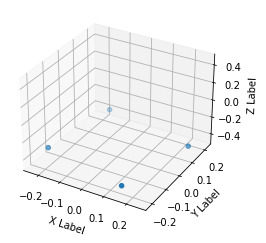

Time diff:  292.0
Footstep timestamp:  2092335.0
Height check index:  9544
Height check timestamp:  2092434.0

FL moving: 0.003456999999999988. FR moving: 0.06656700000000004
RL moving: 0.07454500000000003. RR moving: 0.004639000000000004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396. FR later: -0.329433
RR moving: -0.392. RL moving: -0.395457

Coord FR: [0.159, -0.214, -0.396]. Coord FL: [0.249, 0.127, -0.392]. Coord RR: [-0.235, -0.131, -0.397]. Coord RL: [-0.178, 0.218, -0.402]

FR step_size x: 0.118723. FR step_size y: 0.22637546000000003. RL step_size x: 0.10474900000000001. RL step_size x: 0.16663260000000002.


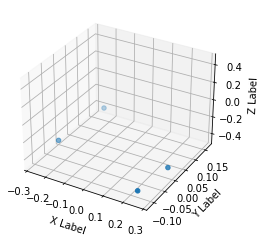

Time diff:  257.0
Footstep timestamp:  2092627.0
Height check index:  9690
Height check timestamp:  2092727.0

FL moving: 0.10165600000000002. FR moving: 0.0010650000000000381
RL moving: 0.00036999999999998145. RR moving: 0.10217700000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.401. FR later: -0.399935
RR moving: -0.398. RL moving: -0.296344

Coord FR: [0.25, -0.113, -0.401]. Coord FL: [0.277, 0.001, -0.398]. Coord RR: [-0.273, -0.02, -0.406]. Coord RL: [-0.245, 0.163, -0.407]

FR step_size x: 0.11300600000000002. FR step_size y: 0.23226200000000002. RL step_size x: 0.10209100000000002. RL step_size x: 0.17457.


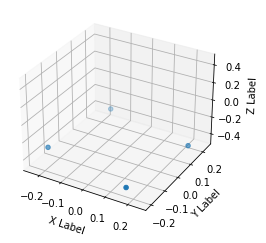

Time diff:  287.0
Footstep timestamp:  2092884.0
Height check index:  9818
Height check timestamp:  2092984.0

FL moving: 0.012272000000000005. FR moving: 0.08911600000000003
RL moving: 0.08176500000000003. RR moving: 0.0022099999999999898

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.4. FR later: -0.310884
RR moving: -0.385. RL moving: -0.397272

Coord FR: [0.172, -0.206, -0.4]. Coord FL: [0.242, 0.14, -0.385]. Coord RR: [-0.239, -0.123, -0.391]. Coord RL: [-0.177, 0.234, -0.389]

FR step_size x: 0.10003300000000001. FR step_size y: 0.23300109. RL step_size x: 0.10616400000000001. RL step_size x: 0.1593325.


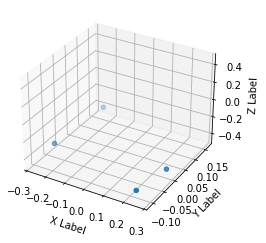

Time diff:  21955.0


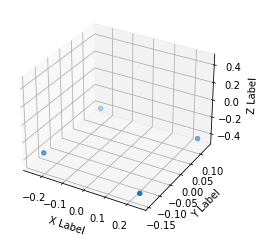

Time diff:  253.0
Footstep timestamp:  2115126.0
Height check index:  10102
Height check timestamp:  2115225.0

FL moving: 0.10047799999999996. FR moving: 0.0002649999999999597
RL moving: 0.004230999999999985. RR moving: 0.10014099999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.417. FR later: -0.416735
RR moving: -0.415. RL moving: -0.314522

Coord FR: [0.236, -0.143, -0.417]. Coord FL: [0.247, 0.123, -0.415]. Coord RR: [-0.253, -0.109, -0.414]. Coord RL: [-0.24, 0.133, -0.419]

FR step_size x: 0.07994699999999999. FR step_size y: 0.06262800000000002. RL step_size x: 0.07306399999999999. RL step_size x: 0.11702800000000001.


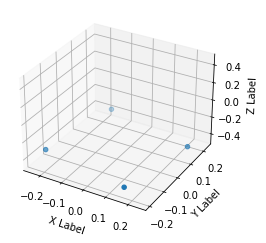

Time diff:  290.0
Footstep timestamp:  2115379.0
Height check index:  10228
Height check timestamp:  2115478.0

FL moving: 0.0066829999999999945. FR moving: 0.07787300000000003
RL moving: 0.07557900000000001. RR moving: 0.0012790000000000301

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404. FR later: -0.326127
RR moving: -0.39. RL moving: -0.396683

Coord FR: [0.162, -0.196, -0.404]. Coord FL: [0.241, 0.133, -0.39]. Coord RR: [-0.243, -0.131, -0.395]. Coord RL: [-0.177, 0.228, -0.39]

FR step_size x: 0.10661899999999999. FR step_size y: 0.19855414000000002. RL step_size x: 0.10782600000000003. RL step_size x: 0.1818548.


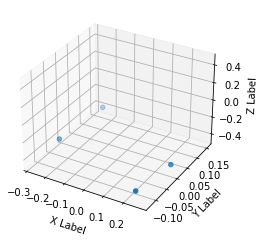

Time diff:  548.0


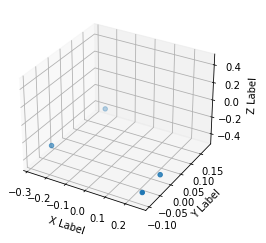

In [44]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.04):    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
                    
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()
        
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
            print("Time diff: ", time_diff)

            if time_diff < 300:
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(dataset[footstep, 34] - dataset[idx_height_check, 34])
                fl_moving = np.abs(dataset[footstep, 37] - dataset[idx_height_check, 37])
                rr_moving = np.abs(dataset[footstep, 40] - dataset[idx_height_check, 40])
                rl_moving = np.abs(dataset[footstep, 43] - dataset[idx_height_check, 43])
                
                print("Footstep timestamp: ", dataset[footstep, 0])
                print("Height check index: ", idx_height_check)
                print("Height check timestamp: ", dataset[idx_height_check, 0])

                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                print(f'\nFL moving: {fl_moving > threshold}. FR moving: {fr_moving > threshold}')
                print(f'RL moving: {rl_moving > threshold}. RR moving: {rr_moving > threshold}')
                
                print(f'\nFR before: {dataset[footstep, 34]}. FR later: {dataset[idx_height_check, 34]}')
                print(f'RR moving: {dataset[footstep, 37]}. RL moving: {dataset[idx_height_check, 37]}')

                assert (fr_moving > threshold) == (rl_moving > threshold)
                assert (rr_moving > threshold) == (fl_moving > threshold)
                assert (fr_moving > threshold) != (fl_moving > threshold)
                
                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fr_movement_y = abs(abs(dataset[footstep, 33]) - abs(dataset[footsteps[idx+1], 33]))
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                fl_movement_y = abs(abs(dataset[footstep, 36]) - abs(dataset[footsteps[idx+1], 36]))
                
                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rr_movement_y = abs(abs(dataset[footstep, 39]) - abs(dataset[footsteps[idx+1], 39]))
                
                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                rl_movement_y = abs(abs(dataset[footstep, 42]) - abs(dataset[footsteps[idx+1], 42]))
                
                
                print(f'\nCoord FR: {[xs[0], ys[0], zs[0]]}. Coord FL: {[xs[1], ys[1], zs[1]]}. Coord RR: {[xs[2], ys[2], zs[2]]}. Coord RL: {[xs[3], ys[3], zs[3]]}')
                
                if fr_moving:
                    print(f'\nFR step_size x: {fr_movement_x + fl_movement_x}. FR step_size y: {fr_movement_y + fl_movement_y}. RL step_size x: {rl_movement_x + rr_movement_x}. RL step_size x: {rl_movement_y + rr_movement_y}.')
                elif fl_moving:
                    print(f'\nFL step_size x: {fr_movement_x + fl_movement_x}. FL step_size y: {fr_movement_y + fl_movement_y}. RR step_size x: {rl_movement_x + rr_movement_x}. RR step_size x: {rl_movement_y + rr_movement_y}.')
                else:
                    print("\nERROR")

visualize_absolute_foostep_sizes(motion_09_clock, footsteps_09_clock)

### Forward motion

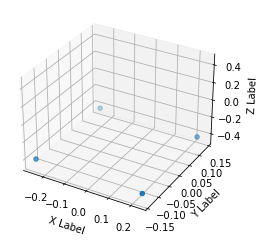

Command: [0.904171 0.       0.      ]. State: [ 0.461005   -0.00693955  0.0611973 ]. Coord: [0.229, -0.138, -0.41].


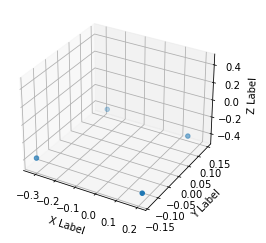

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [0.301288  0.011249  0.0345657]. Coord: [0.202, -0.136, -0.406]. Step size: [-0.026999999999999996, 0.0020000000000000018, 0.003999999999999948].


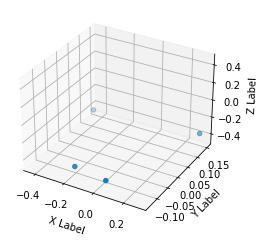

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [ 0.148683  0.137034 -0.633355]. Coord: [0.053, -0.132, -0.395]. Step size: [-0.14900000000000002, 0.0040000000000000036, 0.01100000000000001].


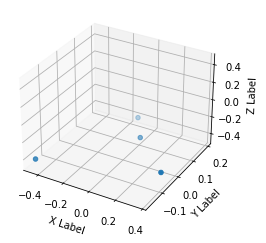

Diff: 276.0. Command: [0.904171 0.       0.      ]. State: [ 0.255933 -0.397428  0.493695]. Coord: [0.365, -0.06, -0.385]. Step size: [0.312, 0.07200000000000001, 0.010000000000000009].


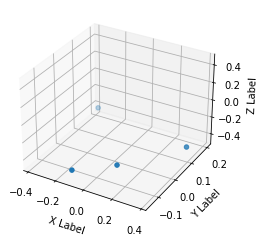

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.998878  -0.0502461 -0.0794176]. Coord: [0.097, -0.063, -0.395]. Step size: [-0.268, -0.0030000000000000027, -0.010000000000000009].


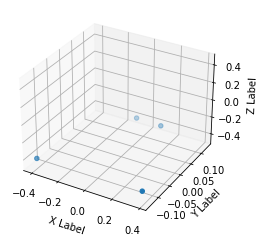

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [0.175241 0.165424 0.448954]. Coord: [0.384, -0.135, -0.383]. Step size: [0.28700000000000003, -0.07200000000000001, 0.01200000000000001].


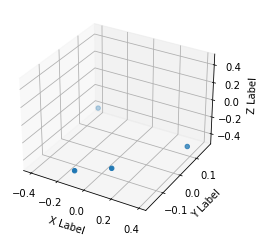

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.282248   0.0455418 -0.265839 ]. Coord: [0.089, -0.111, -0.394]. Step size: [-0.29500000000000004, 0.024000000000000007, -0.01100000000000001].


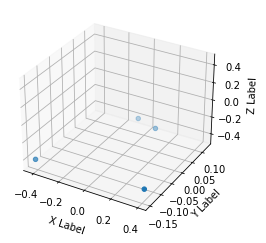

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [0.240814  0.0829354 0.340297 ]. Coord: [0.399, -0.14, -0.383]. Step size: [0.31000000000000005, -0.029000000000000012, 0.01100000000000001].


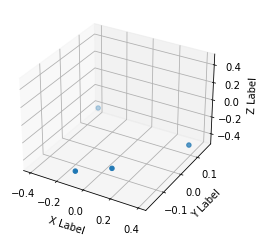

Diff: 266.0. Command: [0.904171 0.       0.      ]. State: [ 0.26335   0.059943 -0.178487]. Coord: [0.094, -0.113, -0.396]. Step size: [-0.30500000000000005, 0.02700000000000001, -0.013000000000000012].


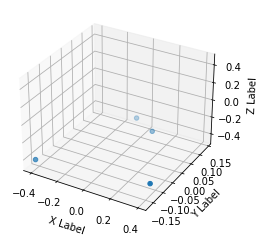

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [0.256764  0.0406068 0.252945 ]. Coord: [0.397, -0.126, -0.386]. Step size: [0.30300000000000005, -0.012999999999999998, 0.010000000000000009].


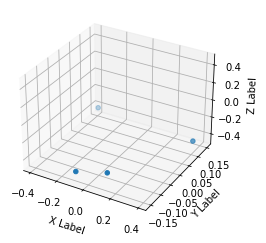

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.229502  -0.0278233 -0.283948 ]. Coord: [0.095, -0.121, -0.397]. Step size: [-0.30200000000000005, 0.0050000000000000044, -0.01100000000000001].


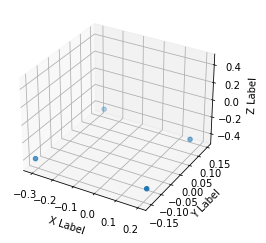

Diff: 7600.0. Command: [0.904171 0.       0.      ]. State: [ 0.325714  -0.0447418  0.116591 ]. Coord: [0.199, -0.133, -0.406]. Step size: [0.10400000000000001, -0.01200000000000001, -0.009000000000000008].


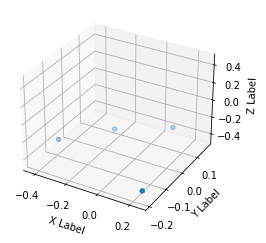

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [0.394975 0.127649 0.79623 ]. Coord: [0.249, -0.195, -0.38]. Step size: [0.04999999999999999, -0.062, 0.026000000000000023].


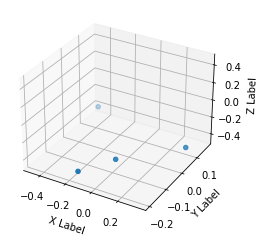

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [ 0.173415  0.183927 -0.749469]. Coord: [0.004, -0.084, -0.391]. Step size: [-0.245, 0.111, -0.01100000000000001].


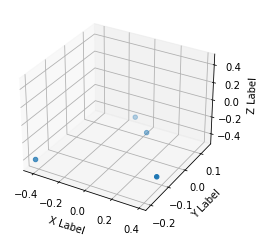

Diff: 276.0. Command: [0.904171 0.       0.      ]. State: [0.547383 0.130634 0.260402]. Coord: [0.39, -0.122, -0.383]. Step size: [0.386, -0.03799999999999999, 0.008000000000000007].


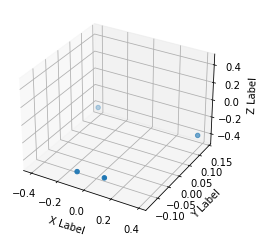

Diff: 251.0. Command: [0.904171 0.       0.      ]. State: [ 1.2        0.0285573 -0.120963 ]. Coord: [0.104, -0.125, -0.396]. Step size: [-0.28600000000000003, -0.0030000000000000027, -0.013000000000000012].


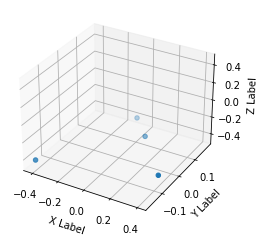

Diff: 275.0. Command: [0.904171 0.       0.      ]. State: [ 0.328773 -0.168052  0.249749]. Coord: [0.401, -0.077, -0.384]. Step size: [0.29700000000000004, 0.048, 0.01200000000000001].


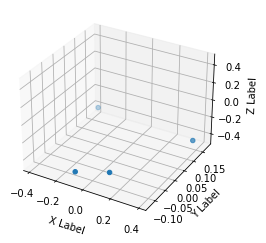

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.201791  -0.076642  -0.0655692]. Coord: [0.106, -0.088, -0.398]. Step size: [-0.29500000000000004, -0.010999999999999996, -0.014000000000000012].


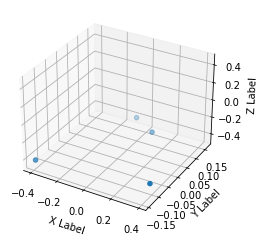

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [1.16713    0.00531302 0.285968  ]. Coord: [0.392, -0.104, -0.384]. Step size: [0.28600000000000003, -0.016, 0.014000000000000012].


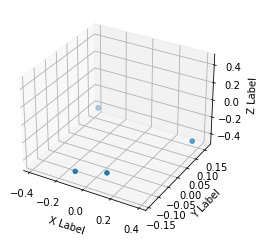

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 1.15096   -0.0209977 -0.188075 ]. Coord: [0.095, -0.111, -0.395]. Step size: [-0.29700000000000004, -0.007000000000000006, -0.01100000000000001].


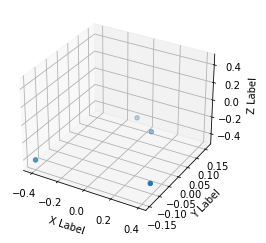

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.16861    0.00319851 0.428713  ]. Coord: [0.395, -0.106, -0.386]. Step size: [0.30000000000000004, 0.0050000000000000044, 0.009000000000000008].


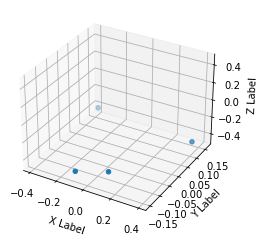

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.210351  -0.0634918 -0.259447 ]. Coord: [0.096, -0.111, -0.396]. Step size: [-0.29900000000000004, -0.0050000000000000044, -0.010000000000000009].


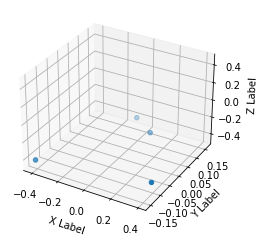

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [1.16019   0.0321816 0.309404 ]. Coord: [0.396, -0.105, -0.388]. Step size: [0.30000000000000004, 0.006000000000000005, 0.008000000000000007].


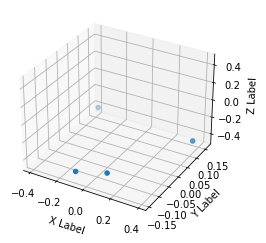

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.14787    0.0594968 -0.20938  ]. Coord: [0.095, -0.113, -0.397]. Step size: [-0.30100000000000005, -0.008000000000000007, -0.009000000000000008].


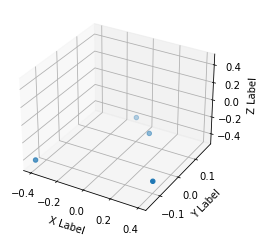

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.15328   0.0307517 0.333905 ]. Coord: [0.396, -0.096, -0.39]. Step size: [0.30100000000000005, 0.017, 0.007000000000000006].


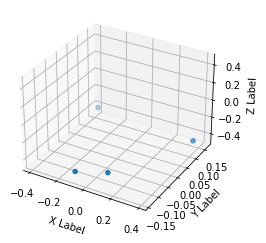

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.235429 -0.092491 -0.238142]. Coord: [0.096, -0.107, -0.399]. Step size: [-0.30000000000000004, -0.010999999999999996, -0.009000000000000008].


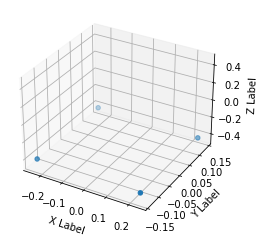

Diff: 58774.0. Command: [0.904171 0.       0.      ]. State: [ 0.199149  -0.0038817  0.0931552]. Coord: [0.231, -0.138, -0.409]. Step size: [0.135, -0.031000000000000014, -0.009999999999999953].


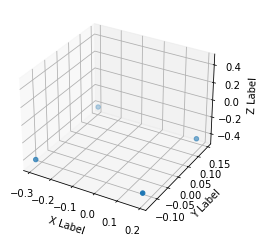

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [0.307928  0.0832301 0.0111299]. Coord: [0.19, -0.129, -0.41]. Step size: [-0.04100000000000001, 0.009000000000000008, -0.0010000000000000009].


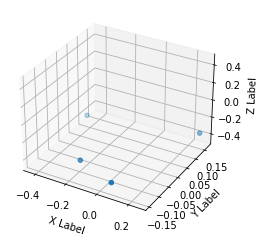

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [ 0.431206   0.0719956 -0.59394  ]. Coord: [0.064, -0.144, -0.398]. Step size: [-0.126, -0.014999999999999986, 0.011999999999999955].


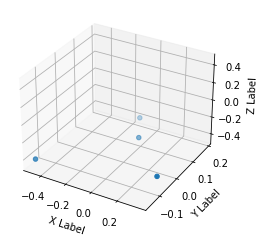

Diff: 277.0. Command: [0.904171 0.       0.      ]. State: [ 0.270204 -0.17545   0.766402]. Coord: [0.354, -0.07, -0.382]. Step size: [0.29, 0.07399999999999998, 0.016000000000000014].


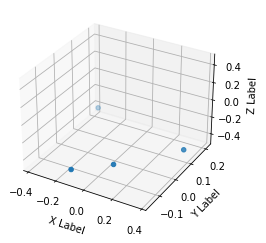

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.979934 -0.189277 -0.117767]. Coord: [0.074, -0.071, -0.394]. Step size: [-0.27999999999999997, -0.000999999999999987, -0.01200000000000001].


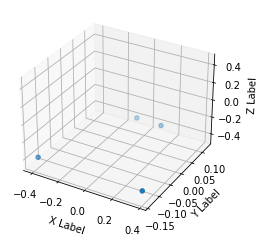

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 1.1571   -0.126069  0.346688]. Coord: [0.385, -0.139, -0.38]. Step size: [0.311, -0.06800000000000002, 0.014000000000000012].


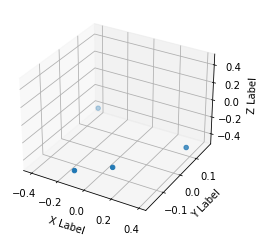

Diff: 270.0. Command: [0.904171 0.       0.      ]. State: [ 0.309271   0.0551509 -0.31058  ]. Coord: [0.088, -0.108, -0.393]. Step size: [-0.29700000000000004, 0.031000000000000014, -0.013000000000000012].


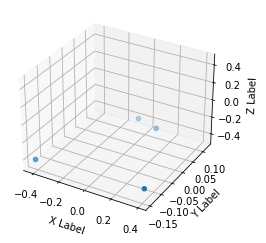

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.1905   -0.111399  0.273185]. Coord: [0.397, -0.14, -0.379]. Step size: [0.30900000000000005, -0.032000000000000015, 0.014000000000000012].


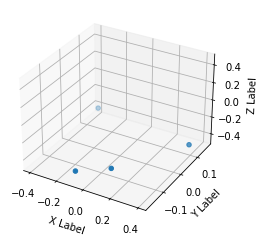

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.2267     0.0688008 -0.232816 ]. Coord: [0.093, -0.114, -0.394]. Step size: [-0.30400000000000005, 0.02600000000000001, -0.015000000000000013].


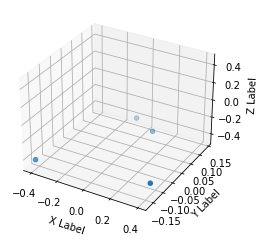

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 1.17858   -0.0300362  0.27425  ]. Coord: [0.398, -0.125, -0.383]. Step size: [0.30500000000000005, -0.010999999999999996, 0.01100000000000001].


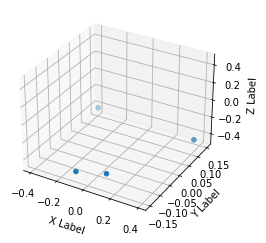

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.198695  -0.0499673 -0.29034  ]. Coord: [0.096, -0.122, -0.396]. Step size: [-0.30200000000000005, 0.0030000000000000027, -0.013000000000000012].


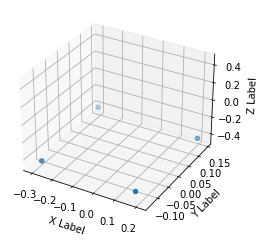

Diff: 12242.0. Command: [0.904171 0.       0.      ]. State: [ 0.305871    0.03018    -0.00591438]. Coord: [0.176, -0.134, -0.411]. Step size: [0.07999999999999999, -0.01200000000000001, -0.014999999999999958].


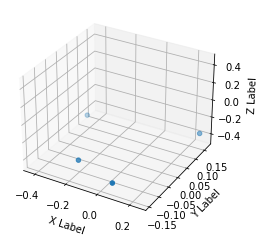

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [ 0.412667   0.0341063 -0.596071 ]. Coord: [0.066, -0.144, -0.399]. Step size: [-0.10999999999999999, -0.009999999999999981, 0.011999999999999955].


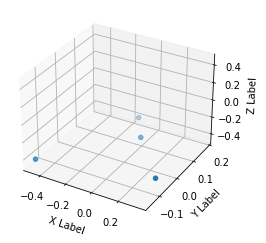

Diff: 279.0. Command: [0.904171 0.       0.      ]. State: [0.958041  0.0710788 0.761076 ]. Coord: [0.342, -0.078, -0.386]. Step size: [0.276, 0.06599999999999999, 0.013000000000000012].


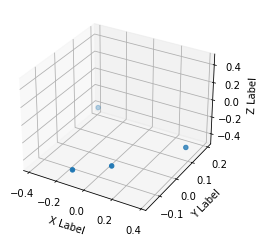

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.00766   -0.0643848 -0.155051 ]. Coord: [0.073, -0.082, -0.392]. Step size: [-0.269, -0.0040000000000000036, -0.006000000000000005].


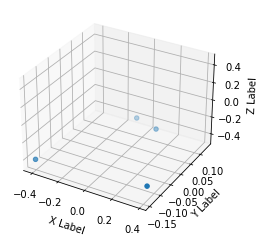

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 1.14828   -0.0499159  0.25188  ]. Coord: [0.387, -0.125, -0.38]. Step size: [0.314, -0.043, 0.01200000000000001].


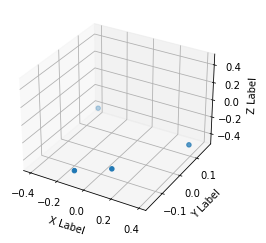

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.289239   -0.00118179 -0.255186  ]. Coord: [0.095, -0.109, -0.393]. Step size: [-0.29200000000000004, 0.016, -0.013000000000000012].


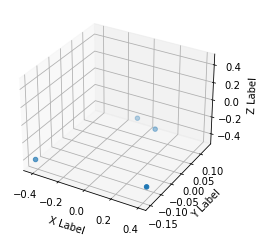

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [0.243009  0.0199667 0.301947 ]. Coord: [0.396, -0.131, -0.383]. Step size: [0.30100000000000005, -0.022000000000000006, 0.010000000000000009].


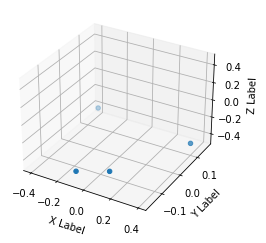

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 1.14665   -0.0560073 -0.27223  ]. Coord: [0.098, -0.12, -0.395]. Step size: [-0.29800000000000004, 0.01100000000000001, -0.01200000000000001].


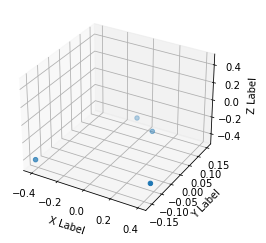

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 1.17175    -0.00723353  0.31473   ]. Coord: [0.398, -0.117, -0.387]. Step size: [0.30000000000000004, 0.002999999999999989, 0.008000000000000007].


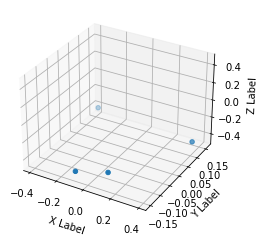

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.227286  -0.0420532 -0.236011 ]. Coord: [0.097, -0.116, -0.397]. Step size: [-0.30100000000000005, 0.0010000000000000009, -0.010000000000000009].


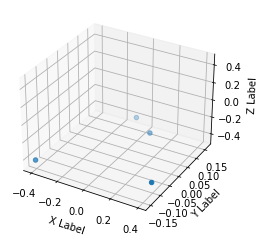

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [1.1533    0.0650156 0.298751 ]. Coord: [0.397, -0.104, -0.39]. Step size: [0.30000000000000004, 0.01200000000000001, 0.007000000000000006].


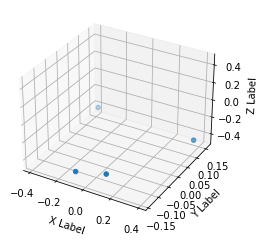

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.14949   0.0414   -0.198727]. Coord: [0.096, -0.114, -0.399]. Step size: [-0.30100000000000005, -0.010000000000000009, -0.009000000000000008].


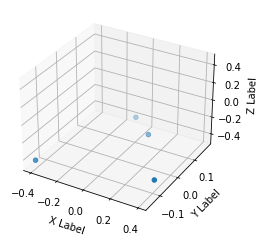

Diff: 272.0. Command: [0.904171 0.       0.      ]. State: [ 0.305977  -0.0662219  0.250814 ]. Coord: [0.396, -0.088, -0.393]. Step size: [0.30000000000000004, 0.02600000000000001, 0.006000000000000005].


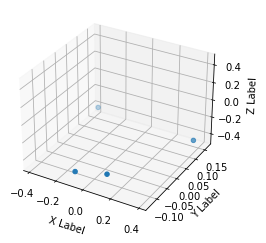

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 1.12015    0.0205963 -0.0975271]. Coord: [0.1, -0.105, -0.401]. Step size: [-0.29600000000000004, -0.017, -0.008000000000000007].


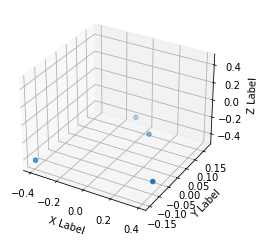

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [0.27554   0.0284551 0.340297 ]. Coord: [0.394, -0.092, -0.393]. Step size: [0.29400000000000004, 0.012999999999999998, 0.008000000000000007].


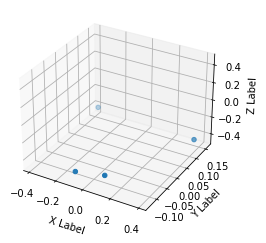

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 0.16994   -0.0750104 -0.142268 ]. Coord: [0.097, -0.111, -0.4]. Step size: [-0.29700000000000004, -0.019000000000000003, -0.007000000000000006].


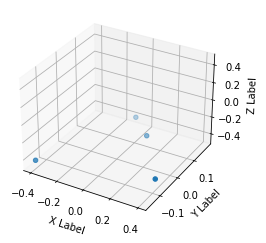

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.329118  -0.0595183  0.268924 ]. Coord: [0.397, -0.083, -0.392]. Step size: [0.30000000000000004, 0.027999999999999997, 0.008000000000000007].


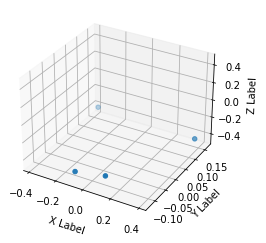

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 0.137558  -0.11276   -0.0879397]. Coord: [0.102, -0.104, -0.401]. Step size: [-0.29500000000000004, -0.02099999999999999, -0.009000000000000008].


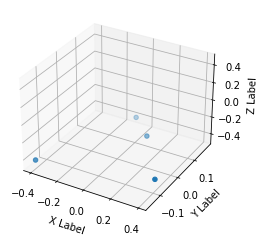

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [0.279615   0.00895331 0.35521   ]. Coord: [0.394, -0.086, -0.392]. Step size: [0.29200000000000004, 0.018000000000000002, 0.009000000000000008].


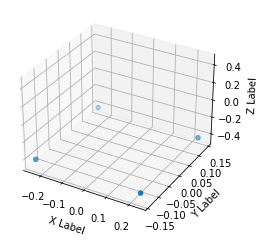

Diff: 41688.0. Command: [0.904171 0.       0.      ]. State: [ 0.0120698   0.00537093 -0.00911017]. Coord: [0.231, -0.138, -0.41]. Step size: [-0.163, -0.05200000000000002, -0.01799999999999996].


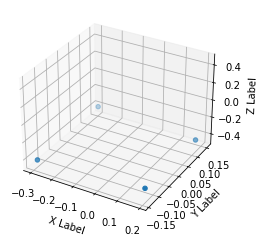

Diff: 275.0. Command: [0.904171 0.       0.      ]. State: [0.295776 0.016408 0.039892]. Coord: [0.182, -0.119, -0.413]. Step size: [-0.049000000000000016, 0.019000000000000017, -0.0030000000000000027].


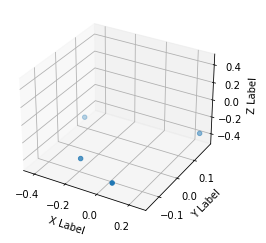

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [ 0.753658  0.314766 -0.596071]. Coord: [0.068, -0.146, -0.399]. Step size: [-0.11399999999999999, -0.026999999999999996, 0.013999999999999957].


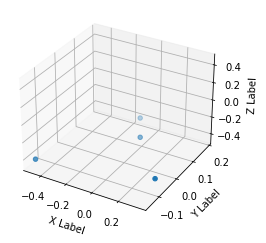

Diff: 281.0. Command: [0.904171 0.       0.      ]. State: [ 0.359711  -0.0459149  0.721661 ]. Coord: [0.342, -0.078, -0.386]. Step size: [0.274, 0.06799999999999999, 0.013000000000000012].


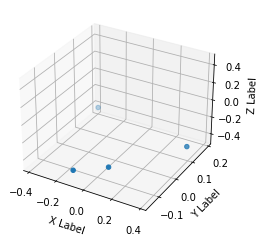

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.290644  -0.0763581 -0.221098 ]. Coord: [0.065, -0.087, -0.394]. Step size: [-0.277, -0.008999999999999994, -0.008000000000000007].


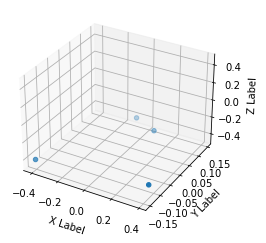

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [0.221997 0.093095 0.311534]. Coord: [0.39, -0.118, -0.384]. Step size: [0.325, -0.031, 0.010000000000000009].


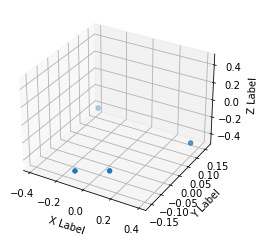

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.194092  -0.0385571 -0.245599 ]. Coord: [0.097, -0.114, -0.393]. Step size: [-0.29300000000000004, 0.00399999999999999, -0.009000000000000008].


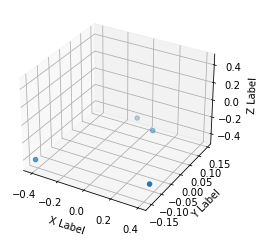

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [0.236913  0.0539211 0.310469 ]. Coord: [0.397, -0.12, -0.385]. Step size: [0.30000000000000004, -0.0059999999999999915, 0.008000000000000007].


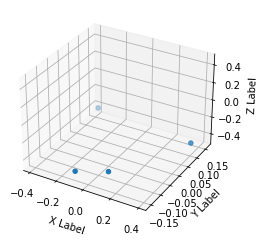

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.225845  -0.0272666 -0.267969 ]. Coord: [0.096, -0.115, -0.396]. Step size: [-0.30100000000000005, 0.0049999999999999906, -0.01100000000000001].


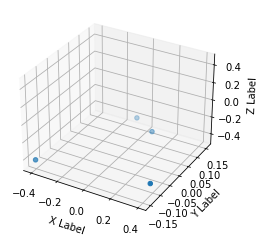

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [0.251433  0.0229603 0.387168 ]. Coord: [0.397, -0.111, -0.387]. Step size: [0.30100000000000005, 0.0040000000000000036, 0.009000000000000008].


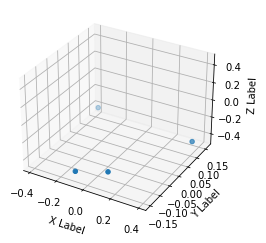

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 0.232769  -0.0402898 -0.278622 ]. Coord: [0.094, -0.113, -0.396]. Step size: [-0.30300000000000005, -0.0020000000000000018, -0.009000000000000008].


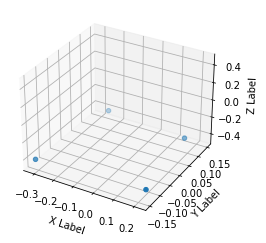

Diff: 33618.0. Command: [0.904171 0.       0.      ]. State: [0.506958  0.0576897 0.117656 ]. Coord: [0.216, -0.13, -0.408]. Step size: [0.122, -0.017, -0.011999999999999955].


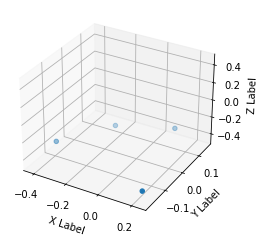

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [0.445464  0.0429238 0.772794 ]. Coord: [0.235, -0.183, -0.382]. Step size: [0.01899999999999999, -0.05299999999999999, 0.025999999999999968].


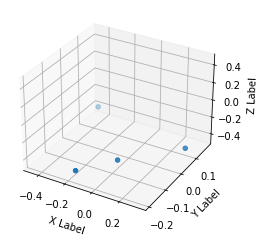

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.148956  0.157407 -0.649334]. Coord: [0.014, -0.08, -0.393]. Step size: [-0.22099999999999997, 0.103, -0.01100000000000001].


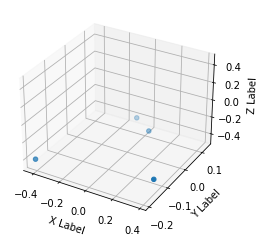

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [1.08719  0.025028 0.321122]. Coord: [0.383, -0.133, -0.379]. Step size: [0.369, -0.053000000000000005, 0.014000000000000012].


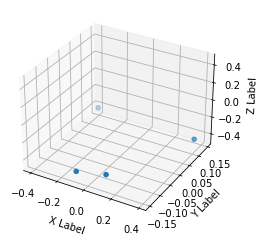

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 1.15798   -0.0414039 -0.165704 ]. Coord: [0.096, -0.126, -0.394]. Step size: [-0.28700000000000003, 0.007000000000000006, -0.015000000000000013].


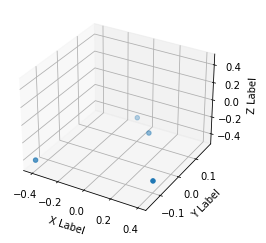

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.307253   -0.00215618  0.303012  ]. Coord: [0.398, -0.097, -0.388]. Step size: [0.30200000000000005, 0.028999999999999998, 0.006000000000000005].


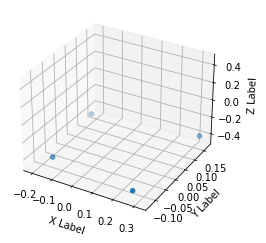

Diff: 815.0. Command: [0.904171 0.       0.      ]. State: [0.331862 0.10294  0.232705]. Coord: [0.272, -0.125, -0.413]. Step size: [-0.126, -0.027999999999999997, -0.024999999999999967].


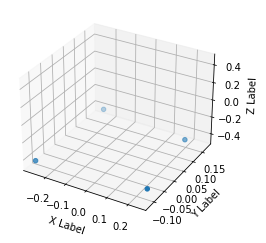

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.415242 -0.116618 -0.089005]. Coord: [0.244, -0.094, -0.414]. Step size: [-0.028000000000000025, 0.031, -0.0010000000000000009].


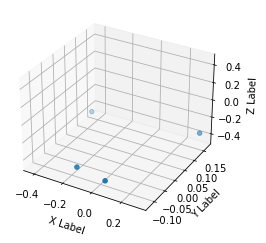

Diff: 247.0. Command: [0.904171 0.       0.      ]. State: [ 0.274323  0.159383 -0.453325]. Coord: [0.061, -0.119, -0.4]. Step size: [-0.183, -0.024999999999999994, 0.013999999999999957].


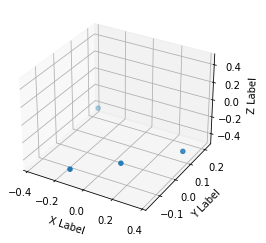

Diff: 559.0. Command: [0.904171 0.       0.      ]. State: [ 0.522065  -0.258816   0.0548057]. Coord: [0.105, -0.053, -0.398]. Step size: [0.044, 0.066, 0.0020000000000000018].


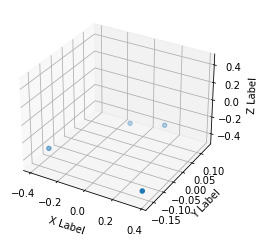

Diff: 253.0. Command: [0.904171 0.       0.      ]. State: [0.0716552 0.410934  0.285968 ]. Coord: [0.374, -0.166, -0.381]. Step size: [0.269, -0.11300000000000002, 0.017000000000000015].


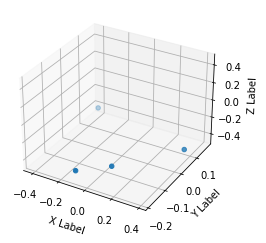

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.336717  0.162905 -0.348929]. Coord: [0.072, -0.115, -0.394]. Step size: [-0.302, 0.051000000000000004, -0.013000000000000012].


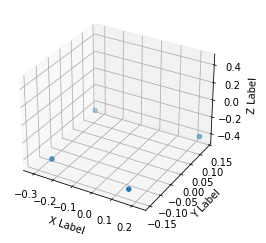

Diff: 11793.0. Command: [0.904171 0.       0.      ]. State: [0.61112   0.0212734 0.0526752]. Coord: [0.162, -0.148, -0.409]. Step size: [0.09000000000000001, -0.03299999999999999, -0.014999999999999958].


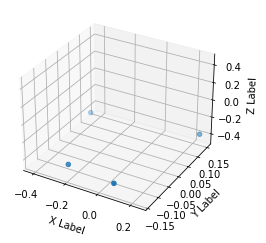

Diff: 255.0. Command: [0.904171 0.       0.      ]. State: [ 0.598908  0.138797 -0.521502]. Coord: [0.073, -0.138, -0.397]. Step size: [-0.08900000000000001, 0.009999999999999981, 0.011999999999999955].


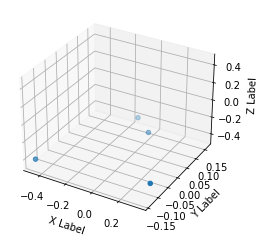

Diff: 277.0. Command: [0.904171 0.       0.      ]. State: [0.927461  0.0178322 0.686508 ]. Coord: [0.338, -0.1, -0.385]. Step size: [0.265, 0.038000000000000006, 0.01200000000000001].


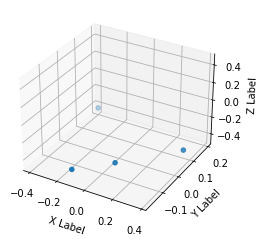

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.228503   0.0170545 -0.193401 ]. Coord: [0.07, -0.082, -0.39]. Step size: [-0.268, 0.018000000000000002, -0.0050000000000000044].


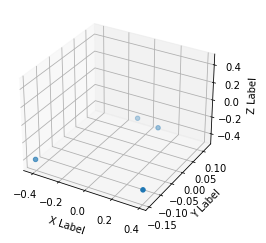

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.15542   -0.0810391  0.382907 ]. Coord: [0.389, -0.142, -0.376]. Step size: [0.319, -0.059999999999999984, 0.014000000000000012].


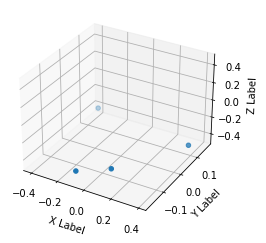

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.236332   0.0389622 -0.244534 ]. Coord: [0.091, -0.117, -0.392]. Step size: [-0.29800000000000004, 0.02499999999999998, -0.016000000000000014].


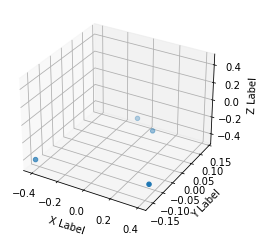

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.226311   -0.00116026  0.322187  ]. Coord: [0.399, -0.13, -0.381]. Step size: [0.30800000000000005, -0.012999999999999998, 0.01100000000000001].


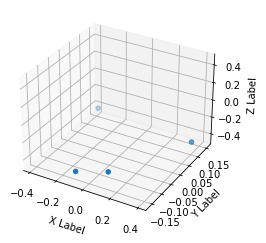

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.16886    0.0103719 -0.197662 ]. Coord: [0.099, -0.122, -0.394]. Step size: [-0.30000000000000004, 0.008000000000000007, -0.013000000000000012].


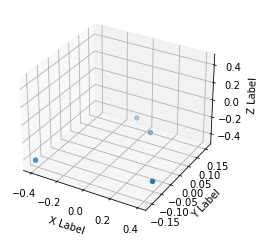

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [0.24751    0.00985317 0.359471  ]. Coord: [0.399, -0.106, -0.387]. Step size: [0.30000000000000004, 0.016, 0.007000000000000006].


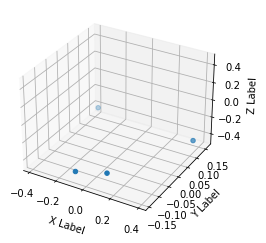

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.199048 -0.040884 -0.24986 ]. Coord: [0.098, -0.114, -0.396]. Step size: [-0.30100000000000005, -0.008000000000000007, -0.009000000000000008].


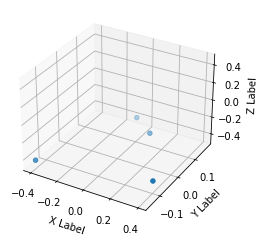

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.177356  -0.0816126  0.307273 ]. Coord: [0.396, -0.095, -0.388]. Step size: [0.29800000000000004, 0.019000000000000003, 0.008000000000000007].


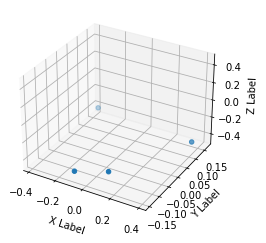

Diff: 265.0. Command: [0.904171 0.       0.      ]. State: [ 1.1351      0.00582968 -0.22962   ]. Coord: [0.099, -0.107, -0.397]. Step size: [-0.29700000000000004, -0.011999999999999997, -0.009000000000000008].


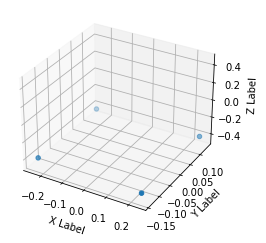

Diff: 12824.0. Command: [0.904171 0.       0.      ]. State: [ 0.130281  -0.0261237 -0.0133712]. Coord: [0.236, -0.141, -0.408]. Step size: [0.13699999999999998, -0.03399999999999999, -0.010999999999999954].


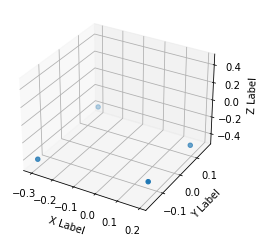

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.363826  -0.0371605  0.0750457]. Coord: [0.172, -0.113, -0.406]. Step size: [-0.064, 0.027999999999999983, 0.0019999999999999463].


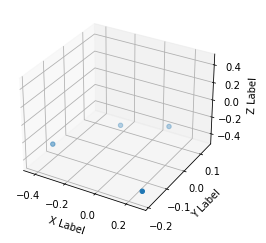

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 0.757017 -0.290174  0.768533]. Coord: [0.272, -0.19, -0.384]. Step size: [0.10000000000000003, -0.077, 0.02200000000000002].


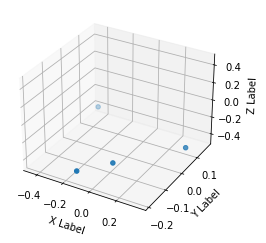

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.10686   0.231221 -0.656791]. Coord: [0.024, -0.102, -0.392]. Step size: [-0.24800000000000003, 0.08800000000000001, -0.008000000000000007].


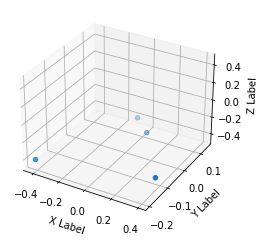

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.15306   0.0315369 0.236966 ]. Coord: [0.396, -0.124, -0.379]. Step size: [0.372, -0.022000000000000006, 0.013000000000000012].


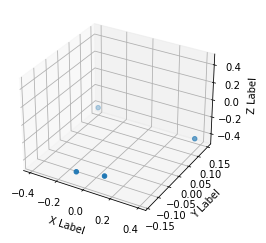

Diff: 262.0. Command: [0.904171 0.       0.      ]. State: [ 0.141927  -0.0860477 -0.143333 ]. Coord: [0.1, -0.123, -0.396]. Step size: [-0.29600000000000004, 0.0010000000000000009, -0.017000000000000015].


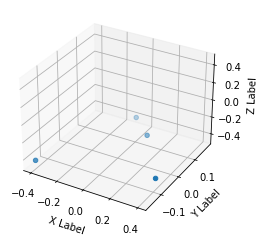

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [0.31374    0.00439589 0.258271  ]. Coord: [0.399, -0.087, -0.389]. Step size: [0.29900000000000004, 0.036000000000000004, 0.007000000000000006].


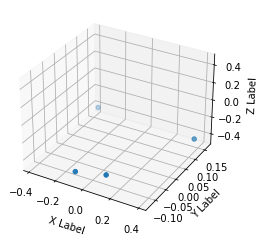

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 0.125623  -0.0885659 -0.0772871]. Coord: [0.103, -0.103, -0.399]. Step size: [-0.29600000000000004, -0.016, -0.010000000000000009].


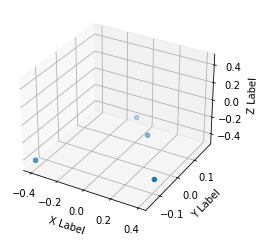

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.15341  0.109192 0.357341]. Coord: [0.395, -0.087, -0.387]. Step size: [0.29200000000000004, 0.016, 0.01200000000000001].


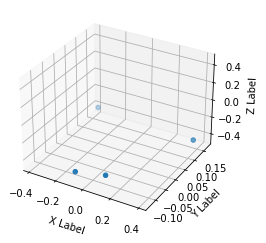

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.165918  -0.0699437 -0.0964618]. Coord: [0.101, -0.105, -0.4]. Step size: [-0.29400000000000004, -0.018000000000000002, -0.013000000000000012].


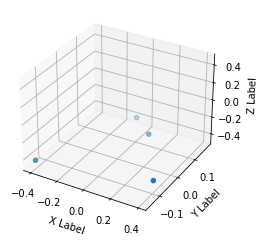

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.14386  0.114196 0.364798]. Coord: [0.395, -0.092, -0.388]. Step size: [0.29400000000000004, 0.012999999999999998, 0.01200000000000001].


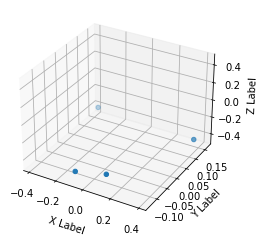

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 1.14306    -0.00617058 -0.116702  ]. Coord: [0.099, -0.107, -0.399]. Step size: [-0.29600000000000004, -0.015, -0.01100000000000001].


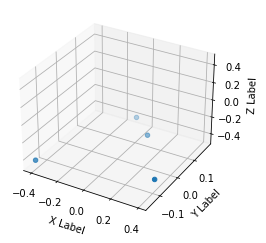

Diff: 274.0. Command: [0.904171 0.       0.      ]. State: [1.14367   0.0706806 0.338166 ]. Coord: [0.395, -0.086, -0.39]. Step size: [0.29600000000000004, 0.021000000000000005, 0.009000000000000008].


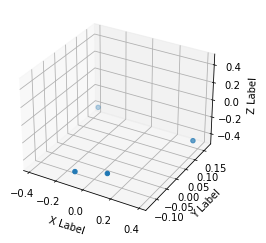

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.11447    0.0147112 -0.118832 ]. Coord: [0.098, -0.101, -0.4]. Step size: [-0.29700000000000004, -0.015000000000000013, -0.010000000000000009].


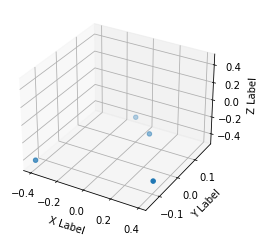

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [0.252615  0.0423157 0.298751 ]. Coord: [0.394, -0.091, -0.392]. Step size: [0.29600000000000004, 0.010000000000000009, 0.008000000000000007].


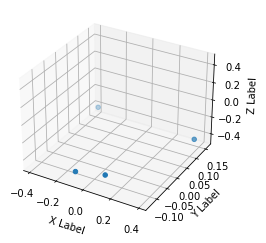

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 1.13898    0.0486874 -0.142268 ]. Coord: [0.095, -0.11, -0.4]. Step size: [-0.29900000000000004, -0.019000000000000003, -0.008000000000000007].


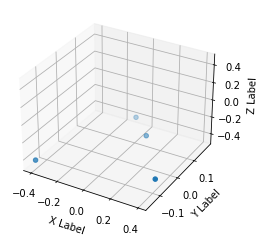

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.306108  -0.0822598  0.308339 ]. Coord: [0.396, -0.083, -0.393]. Step size: [0.30100000000000005, 0.026999999999999996, 0.007000000000000006].


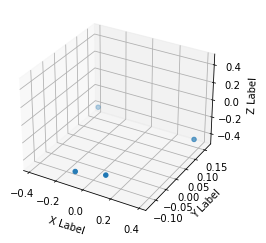

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 1.12889    0.0248275 -0.100723 ]. Coord: [0.098, -0.104, -0.402]. Step size: [-0.29800000000000004, -0.02099999999999999, -0.009000000000000008].


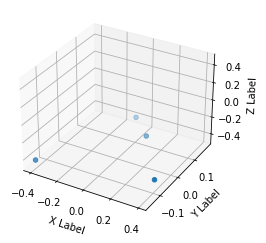

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.268167  -0.0424524  0.364798 ]. Coord: [0.394, -0.088, -0.392]. Step size: [0.29600000000000004, 0.016, 0.010000000000000009].


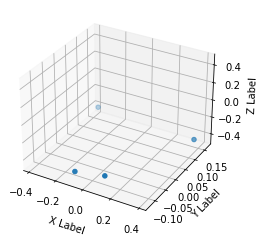

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 0.184699  -0.105528  -0.0794176]. Coord: [0.098, -0.105, -0.402]. Step size: [-0.29600000000000004, -0.017, -0.010000000000000009].


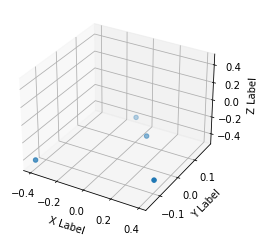

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [ 0.230223  -0.0481031  0.313665 ]. Coord: [0.392, -0.089, -0.391]. Step size: [0.29400000000000004, 0.016, 0.01100000000000001].


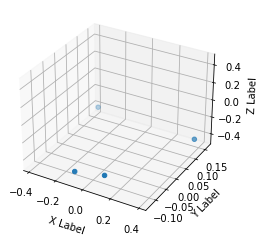

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.18914   -0.0946429 -0.131616 ]. Coord: [0.095, -0.107, -0.401]. Step size: [-0.29700000000000004, -0.018000000000000002, -0.010000000000000009].


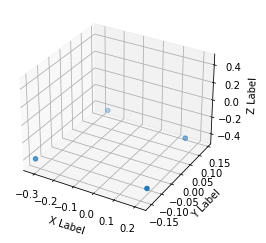

Diff: 53208.0. Command: [0.904171 0.       0.      ]. State: [ 0.165249 -0.150287  0.101677]. Coord: [0.213, -0.133, -0.406]. Step size: [0.118, -0.02600000000000001, -0.0050000000000000044].


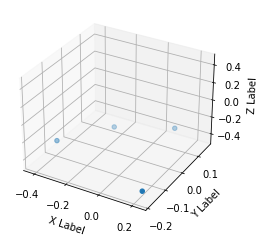

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [0.459901  0.0491658 0.761076 ]. Coord: [0.233, -0.186, -0.383]. Step size: [0.020000000000000018, -0.05299999999999999, 0.02300000000000002].


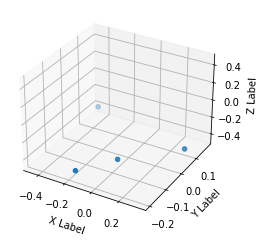

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.134301  0.205257 -0.635486]. Coord: [0.013, -0.079, -0.393]. Step size: [-0.22, 0.107, -0.010000000000000009].


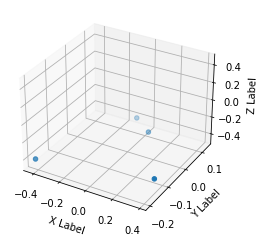

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.10147   0.0118577 0.297686 ]. Coord: [0.384, -0.134, -0.38]. Step size: [0.371, -0.05500000000000001, 0.013000000000000012].


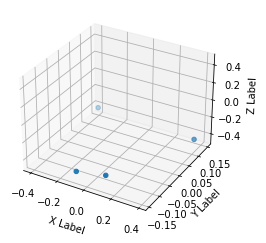

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 1.15296   -0.0383857 -0.138007 ]. Coord: [0.099, -0.125, -0.395]. Step size: [-0.28500000000000003, 0.009000000000000008, -0.015000000000000013].


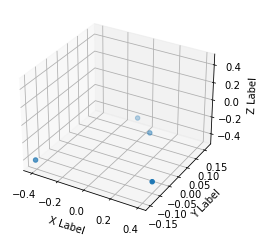

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [ 0.198686  -0.0520561  0.295555 ]. Coord: [0.398, -0.099, -0.388]. Step size: [0.29900000000000004, 0.025999999999999995, 0.007000000000000006].


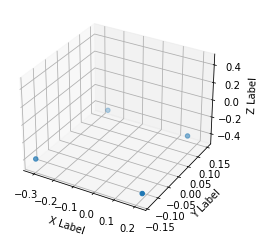

Diff: 26892.0. Command: [0.904171 0.       0.      ]. State: [ 0.200745  -0.0702695  0.0654583]. Coord: [0.214, -0.136, -0.41]. Step size: [-0.18400000000000002, -0.037000000000000005, -0.021999999999999964].


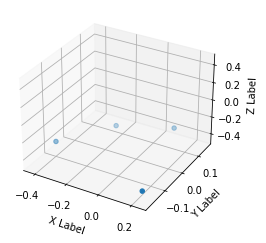

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [0.444257   0.00119421 0.73764   ]. Coord: [0.237, -0.182, -0.382]. Step size: [0.022999999999999993, -0.045999999999999985, 0.02799999999999997].


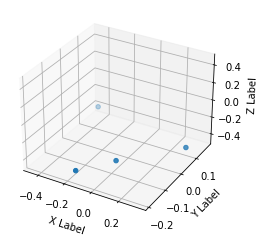

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 0.130037  0.178987 -0.644008]. Coord: [0.013, -0.084, -0.393]. Step size: [-0.22399999999999998, 0.09799999999999999, -0.01100000000000001].


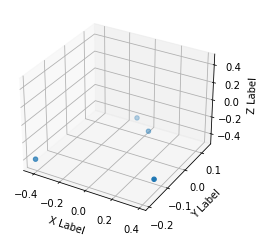

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.11214   0.0777442 0.381842 ]. Coord: [0.388, -0.131, -0.381]. Step size: [0.375, -0.047, 0.01200000000000001].


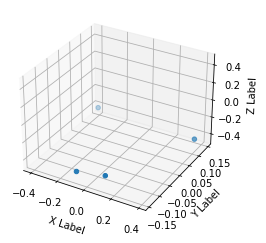

Diff: 259.0. Command: [0.904171 0.       0.      ]. State: [ 0.106971 -0.122579 -0.138007]. Coord: [0.098, -0.127, -0.395]. Step size: [-0.29000000000000004, 0.0040000000000000036, -0.014000000000000012].


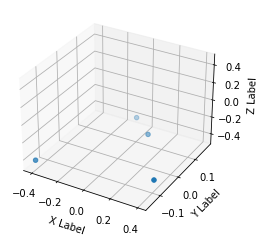

Diff: 273.0. Command: [0.904171 0.       0.      ]. State: [ 0.328939  -0.0567241  0.285968 ]. Coord: [0.399, -0.091, -0.389]. Step size: [0.30100000000000005, 0.036000000000000004, 0.006000000000000005].


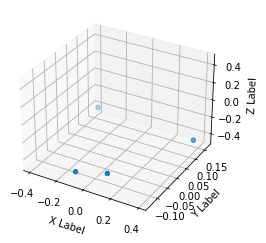

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 0.206498 -0.073155 -0.174226]. Coord: [0.098, -0.105, -0.399]. Step size: [-0.30100000000000005, -0.013999999999999999, -0.010000000000000009].


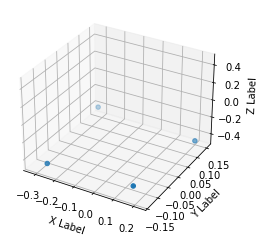

Diff: 56359.0. Command: [0.904171 0.       0.      ]. State: [ 0.479515   -0.00526679  0.00793406]. Coord: [0.157, -0.118, -0.414]. Step size: [0.059, -0.012999999999999998, -0.014999999999999958].


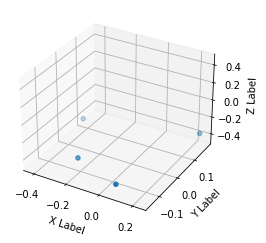

Diff: 257.0. Command: [0.904171 0.       0.      ]. State: [ 0.492695   0.0465175 -0.664248 ]. Coord: [0.075, -0.148, -0.4]. Step size: [-0.082, -0.03, 0.013999999999999957].


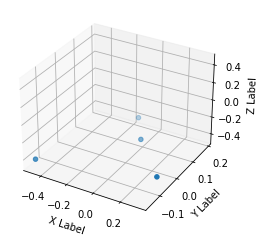

Diff: 281.0. Command: [0.904171 0.       0.      ]. State: [0.897882  0.0443444 0.664137 ]. Coord: [0.325, -0.072, -0.386]. Step size: [0.25, 0.076, 0.014000000000000012].


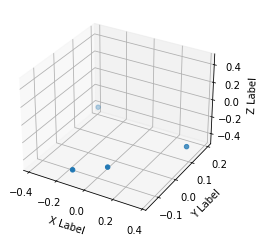

Diff: 261.0. Command: [0.904171 0.       0.      ]. State: [ 0.20018  -0.108278 -0.201923]. Coord: [0.055, -0.086, -0.393]. Step size: [-0.27, -0.013999999999999999, -0.007000000000000006].


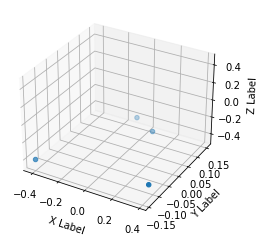

Diff: 266.0. Command: [0.904171 0.       0.      ]. State: [0.165987  0.0758466 0.275315 ]. Coord: [0.387, -0.112, -0.383]. Step size: [0.332, -0.02600000000000001, 0.010000000000000009].


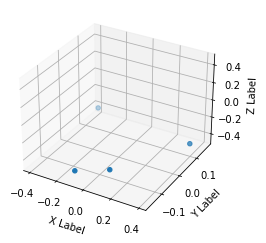

Diff: 267.0. Command: [0.904171 0.       0.      ]. State: [ 1.11321   -0.0561276 -0.275426 ]. Coord: [0.091, -0.112, -0.393]. Step size: [-0.29600000000000004, 0.0, -0.010000000000000009].


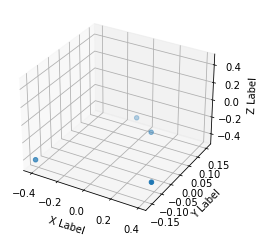

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [1.15189   0.0127768 0.341362 ]. Coord: [0.395, -0.112, -0.385]. Step size: [0.30400000000000005, 0.0, 0.008000000000000007].


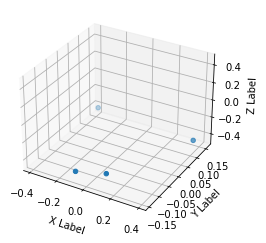

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 0.175761  -0.0602503 -0.20938  ]. Coord: [0.095, -0.117, -0.396]. Step size: [-0.30000000000000004, -0.0050000000000000044, -0.01100000000000001].


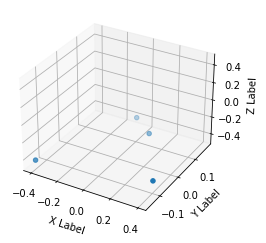

Diff: 269.0. Command: [0.904171 0.       0.      ]. State: [ 0.247824 -0.103801  0.376516]. Coord: [0.397, -0.095, -0.387]. Step size: [0.30200000000000005, 0.022000000000000006, 0.009000000000000008].


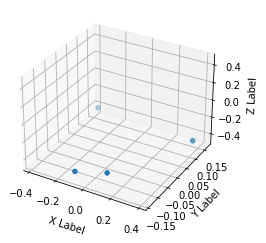

Diff: 263.0. Command: [0.904171 0.       0.      ]. State: [ 1.14480e+00  4.90498e-04 -1.40138e-01]. Coord: [0.096, -0.107, -0.398]. Step size: [-0.30100000000000005, -0.011999999999999997, -0.01100000000000001].


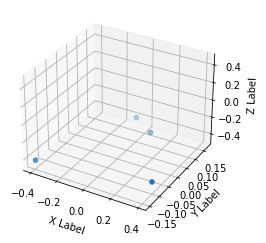

Diff: 271.0. Command: [0.904171 0.       0.      ]. State: [1.14692  0.070852 0.435105]. Coord: [0.395, -0.097, -0.388]. Step size: [0.29900000000000004, 0.009999999999999995, 0.010000000000000009].


In [45]:
visualize_static_foosteps(motion_09_fwd, footsteps_09_fwd)

RuntimeError: Requested MovieWriter (ffmpeg) not available

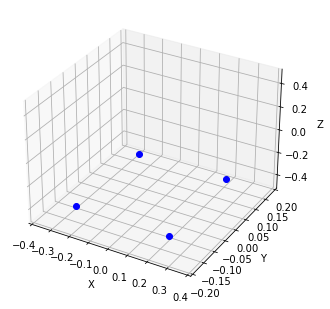

In [46]:
anim = visualize_animated_footsteps(motion_09_fwd, footsteps_09_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

In [ ]:
anim = visualize_animated_footsteps(motion_09_bwd, footsteps_09_bwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

In [ ]:
anim = visualize_animated_footsteps(motion_09_side_right, footsteps_09_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

In [ ]:
anim = visualize_animated_footsteps(motion_09_side_left, footsteps_09_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_09_clock, footsteps_09_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_09_count, footsteps_09_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [47]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [48]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [49]:
def create_timestamp_consistent_dataset(dataset, footsteps):
    # Footsteps sizes
    inputs = []
    labels = []
        
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                labels.append(dataset[footsteps[idx], 32:44])
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_09_fwd_3D, Y_motion_09_fwd_3D = create_timestamp_consistent_dataset(motion_09_fwd, footsteps_09_fwd)
X_motion_09_bwd_3D, Y_motion_09_bwd_3D = create_timestamp_consistent_dataset(motion_09_bwd, footsteps_09_bwd)
X_motion_09_clock_3D, Y_motion_09_clock_3D = create_timestamp_consistent_dataset(motion_09_clock, footsteps_09_clock)
X_motion_09_count_3D, Y_motion_09_count_3D = create_timestamp_consistent_dataset(motion_09_count, footsteps_09_count)
X_motion_09_side_left_3D, Y_motion_09_side_left_3D = create_timestamp_consistent_dataset(motion_09_side_left, footsteps_09_side_left)
X_motion_09_side_right_3D, Y_motion_09_side_right_3D = create_timestamp_consistent_dataset(motion_09_side_right, footsteps_09_side_right)

# Stack datasets
X_motion_09_3D = np.concatenate((X_motion_09_fwd_3D, X_motion_09_bwd_3D, X_motion_09_side_right_3D, X_motion_09_side_left_3D, X_motion_09_clock_3D, X_motion_09_count_3D))
Y_motion_09_3D = np.concatenate((Y_motion_09_fwd_3D, Y_motion_09_bwd_3D, Y_motion_09_side_right_3D, Y_motion_09_side_left_3D, Y_motion_09_clock_3D, Y_motion_09_count_3D))

In [53]:
%store X_motion_09_3D
%store Y_motion_09_3D

Stored 'X_motion_09_3D' (ndarray)
Stored 'Y_motion_09_3D' (ndarray)


In [50]:
def create_timestamp_consistent_dataset_with_step_size_labels(dataset, footsteps, threshold=0.04):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 300:
                # Input (command, state, x/y/z position for each foot)
                #inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(dataset[footstep, 34] - dataset[idx_height_check, 34]) > threshold
                fl_moving = np.abs(dataset[footstep, 37] - dataset[idx_height_check, 37]) > threshold
                rr_moving = np.abs(dataset[footstep, 40] - dataset[idx_height_check, 40]) > threshold
                rl_moving = np.abs(dataset[footstep, 43] - dataset[idx_height_check, 43]) > threshold

                assert fr_moving == rl_moving
                assert rr_moving == fl_moving
                assert fr_moving != fl_moving
                
                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fr_movement_y = abs(abs(dataset[footstep, 33]) - abs(dataset[footsteps[idx+1], 33]))
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                fl_movement_y = abs(abs(dataset[footstep, 36]) - abs(dataset[footsteps[idx+1], 36]))
                
                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rr_movement_y = abs(abs(dataset[footstep, 39]) - abs(dataset[footsteps[idx+1], 39]))
                
                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                rl_movement_y = abs(abs(dataset[footstep, 42]) - abs(dataset[footsteps[idx+1], 42]))
                
                label = []
                                
                if fr_moving:
                    label.append([fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, 0, 0, 0, 0, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y])
                elif fl_moving:
                    label.append([0, 0, fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y, 0, 0])
                else:
                    print("\nERROR")
                    
                labels.append(label)
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + [int(fr_moving), int(fl_moving), int(rr_moving), int(rl_moving)])
                
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy.reshape(labels_numpy.shape[0], labels_numpy.shape[2])

X_motion_09_fwd_step, Y_motion_09_fwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_fwd, footsteps_09_fwd)
X_motion_09_bwd_step, Y_motion_09_bwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_bwd, footsteps_09_bwd)
X_motion_09_clock_step, Y_motion_09_clock_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_clock, footsteps_09_clock)
X_motion_09_count_step, Y_motion_09_count_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_count, footsteps_09_count)
X_motion_09_side_left_step, Y_motion_09_side_left_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_side_left, footsteps_09_side_left)
X_motion_09_side_right_step, Y_motion_09_side_right_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_09_side_right, footsteps_09_side_right)

# Stack datasets
X_motion_09_step = np.concatenate((X_motion_09_fwd_step, X_motion_09_bwd_step, X_motion_09_side_right_step, X_motion_09_side_left_step, X_motion_09_clock_step, X_motion_09_count_step))
Y_motion_09_step = np.concatenate((Y_motion_09_fwd_step, Y_motion_09_bwd_step, Y_motion_09_side_right_step, Y_motion_09_side_left_step, Y_motion_09_clock_step, Y_motion_09_count_step))

In [51]:
%store X_motion_09_step
%store Y_motion_09_step

Stored 'X_motion_09_step' (ndarray)
Stored 'Y_motion_09_step' (ndarray)


In [52]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} motion\n')
    
    # Find all positive movements in x and y for FR
    fr_steps_x = np.where(dataset[:, 0] > 0)[0]
    fr_steps_y = np.where(dataset[:, 1] > 0)[0]
    
    # Find all positive movements in x and y for FR
    fl_steps_x = np.where(dataset[:, 2] > 0)[0]
    fl_steps_y = np.where(dataset[:, 3] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rr_steps_x = np.where(dataset[:, 4] > 0)[0]
    rr_steps_y = np.where(dataset[:, 5] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rl_steps_x = np.where(dataset[:, 6] > 0)[0]
    rl_steps_y = np.where(dataset[:, 7] > 0)[0]
    
    # Compute stats for FR foot
    print(f'FR mean x step: {np.mean(dataset[fr_steps_x, 0])}. FR std x step: {np.std(dataset[fr_steps_x, 0])}. FR mean y step: {np.mean(dataset[fr_steps_y, 1])}. FR std y step: {np.mean(dataset[fr_steps_y, 1])}')
 
    # Compute stats for FL foot
    print(f'FL mean x step: {np.mean(dataset[fl_steps_x, 2])}. FL std x step: {np.std(dataset[fl_steps_x, 2])}. FL mean y step: {np.mean(dataset[fl_steps_y, 3])}. FL std y step: {np.mean(dataset[fl_steps_y, 3])}')
    
    # Compute stats for RR foot
    print(f'RR mean x step: {np.mean(dataset[rr_steps_x, 4])}. RR std x step: {np.std(dataset[rr_steps_x, 4])}. RR mean y step: {np.mean(dataset[rr_steps_y, 5])}. RR std y step: {np.mean(dataset[rr_steps_y, 5])}')
    
    # Compute stats for RL foot
    print(f'RL mean x step: {np.mean(dataset[rl_steps_x, 6])}. RL std x step: {np.std(dataset[rl_steps_x, 6])}. RL mean y step: {np.mean(dataset[rl_steps_y, 7])}. RL std y step: {np.mean(dataset[rl_steps_y, 7])}\n')
    
labels_stats(Y_motion_09_fwd_step, "forward")
labels_stats(Y_motion_09_bwd_step, "backward")
labels_stats(Y_motion_09_clock_step, "clockwise")
labels_stats(Y_motion_09_count_step, "counter clockwise")
labels_stats(Y_motion_09_side_left_step, "left step")
labels_stats(Y_motion_09_side_right_step, "right step")

Statistics for forward motion

FR mean x step: 0.5254838709677421. FR std x step: 0.1693174858961026. FR mean y step: 0.052661290322580635. FR std y step: 0.052661290322580635
FL mean x step: 0.5402741935483871. FL std x step: 0.14681392319430905. FL mean y step: 0.04801612903225807. FL std y step: 0.04801612903225807
RR mean x step: 0.5520967741935484. RR std x step: 0.14167280678783264. RR mean y step: 0.054483870967741925. RR std y step: 0.054483870967741925
RL mean x step: 0.5369516129032259. RL std x step: 0.1645722145069487. RL mean y step: 0.05570967741935484. RL std y step: 0.05570967741935484

Statistics for backward motion

FR mean x step: 0.25900383132530114. FR std x step: 0.06533398576910468. FR mean y step: 0.04250584939759036. FR std y step: 0.04250584939759036
FL mean x step: 0.26221659493670885. FL std x step: 0.058795343686624785. FL mean y step: 0.043094082278481015. FL std y step: 0.043094082278481015
RR mean x step: 0.2658031518987342. RR std x step: 0.059454762097